# Building a Machine Learning Model
_Authors: Mijee Kim, Josh Iwanicki, Nathan Robertson_

Taking all of the data we've gathered, cleaned, and feature engineered, let's now build a model with the best predictive power for a home's price.

In [1]:
# This resolves a Azure cloud computing specific enviornments issue, and can be ignored.
#!conda install -n azureml_py310_sdkv2 seaborn xgboost lightgbm -y

In [1]:
# The warnings this notebook generates can be ignored -- most are irrelevant errors for this workflow.
import warnings
warnings.filterwarnings('ignore')


# Data manipulation packages.
import numpy as np
import pandas as pd
import pickle
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Machine learning preprocssing packages.
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer

# Machine learning performance monitoring and evaluation packages.
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error, make_scorer
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV

# Data visualization packages.
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
import matplotlib.patheffects as pe
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl
mpl.rcParams['font.family'] = 'monospace'

# Machine learning models.
import xgboost as xgb
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import (
    LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge, Lars, LassoLars, 
    OrthogonalMatchingPursuit, SGDRegressor, PassiveAggressiveRegressor, HuberRegressor,
    RANSACRegressor, TheilSenRegressor
)
from sklearn.ensemble import (
    RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, 
    AdaBoostRegressor, HistGradientBoostingRegressor
)
from sklearn.tree import DecisionTreeRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# For tracking operations in the notebook.
from tqdm import tqdm

### Loading in the Data

We'll load in all of the data we gathered throughout earlier stages of the projects.

* The Zillow data.
* The Points of Interest data.
* The image data.
* A list of listings to drop based on their inferred "junk" status.

In [2]:
# Load files.
zillow_df = pd.read_csv('BACKUP cleaned_zillow_data.csv').drop(columns=['Unnamed: 0'])
poi_df = pd.read_csv('BACKUP points_of_interest_data.csv').drop(columns=['Unnamed: 0'])
junk_df = pd.read_csv('inferredJunkListings.csv').drop(columns=['Unnamed: 0'])
image_df = pd.read_csv('final_image_predictions.csv').drop(columns=['Unnamed: 0'])

In [3]:
# Peek at images df.
image_df.head()

,zillowId,Bathroom_count,Bedroom_count,Kitchen_count,Living Room_count,Location Exterior_count,Other_count,Bathroom_min_rank,Bedroom_min_rank,Kitchen_min_rank,Living Room_min_rank,Location Exterior_min_rank,Other_min_rank,Bathroom_max_rank,Bedroom_max_rank,Kitchen_max_rank,Living Room_max_rank,Location Exterior_max_rank,Other_max_rank,Bathroom_mean_rank,Bedroom_mean_rank,Kitchen_mean_rank,Living Room_mean_rank,Location Exterior_mean_rank,Other_mean_rank,Bathroom_range_rank,Bedroom_range_rank,Kitchen_range_rank,Living Room_range_rank,Location Exterior_range_rank,Other_range_rank
0,67873,6.0,0.0,2.0,0.0,7.0,20.0,4.0,0.0,6.0,0.0,2.0,0.0,5.0,0.0,7.0,0.0,5.0,0.0,4.833333,0.0,6.5,0.0,3.285714,0.0,1.0,0.0,1.0,0.0,3.0,0.0
1,67956,0.0,1.0,1.0,0.0,5.0,3.0,0.0,4.0,3.0,0.0,2.0,0.0,0.0,4.0,3.0,0.0,5.0,0.0,0.000000,4.0,3.0,0.0,3.400000,0.0,0.0,0.0,0.0,0.0,3.0,0.0
2,87482,1.0,3.0,2.0,0.0,15.0,8.0,3.0,3.0,3.0,0.0,3.0,0.0,3.0,3.0,4.0,0.0,6.0,0.0,3.000000,3.0,3.5,0.0,4.266667,0.0,0.0,0.0,1.0,0.0,3.0,0.0
3,88272,2.0,6.0,4.0,1.0,8.0,5.0,3.0,4.0,6.0,3.0,2.0,0.0,5.0,6.0,7.0,3.0,6.0,0.0,4.000000,5.0,6.5,3.0,3.625000,0.0,2.0,2.0,1.0,0.0,4.0,0.0
4,89400,0.0,2.0,1.0,0.0,9.0,19.0,0.0,4.0,6.0,0.0,1.0,0.0,0.0,4.0,6.0,0.0,4.0,0.0,0.000000,4.0,6.0,0.0,2.777778,0.0,0.0,0.0,0.0,0.0,3.0,0.0


In [4]:
# Merge files.
df = pd.merge(zillow_df, poi_df, how='left', on='zillowId')
df = pd.merge(df, image_df, how='left', on='zillowId')

In [5]:
# Peek at merged df.
df.head()

,zillowId,homeStatus,streetAdress,city,state_x,zipcode_x,price,bedrooms,bathrooms,yearBuilt,zestimate,homeType,livingArea,hasGarage,parkingCapacity,sewer,hasHeating,fireplaces,hasWaterfrontView,isSeniorCommunity,levels,lotSize,hoaFee,buyersFeePerc,daysOnZillow,views,favorites,latitude_x,longitude_x,mainPhoto,brokerage,percSellFaster,propertyTax,mortgageRate,listingUserId,agentName,agentRating,agentRecentSales,agentReviewsCount,photosList,isForeclosure,isBankOwned,rentZestimate,totalActualRent,annual_house_insurance,price_history,description,similarHomes,termsCash,termsConventional,termsFHA,termsVA,schoolAverageDistance,schoolContainsCharter,schoolRatingElementary,schoolRatingMiddleSchool,schoolRatingHighSchool,hasPatioPorch,ngram_dolean,ngram_options vast endless,ngram_possibilities,ngram_community design exclusive,ngram_estate,ngram_stewarded,ngram_lucite,ngram_arclinea,ngram_marble block kitchen,ngram_downtown ocean best,ngram_brand arclinea entertainers,ngram_bathrooms magnificient guest,ngram_macassar,ngram_wine,ngram_masterpiece,ngram_private,ngram_cellar,ngram_infinity,ngram_expansive,ngram_intracoastalview,ngram_designed,ngram_chefs,ngram_parties grand,ngram_court tennis house,ngram_regencystyle,ngram_art deco gates,ngram_imposing main house,ngram_mansions dotting nearby,ngram_luxury,ngram_unparalleled,ngram_marble,ngram_architect,ngram_theater,ngram_outside scenery,ngram_staff,ngram_massage room,ngram_custom,ngram_magnificent,ngram_extraordinary,ngram_privately owned island,ngram_gourmet,ngram_iconic,ngram_stunning,ngram_infinityedge,ngram_panoramic,ngram_unobstructued sunrise sunset,ngram_aged white,ngram_experience perfect relaxation,ngram_indooroutdoor,ngram_court,ngram_architectural,ngram_subzero,ngram_rarefied,ngram_antiquities,ngram_sauna,ngram_terrace,ngram_saota,ngram_italian,national_park,post_office,tiny_museum,small_museum,medium_museum,large_museum,massive_museum,top_trail,hidden_gem_trail,tougth_to_love_trail,under_the_radar_trail,prison,clean_power_plant,dirty_power_plant,police_station,most_serious_crimes_per_capita,serious_crimes_per_capita,less_serious_crimes_per_capita,total_stolen_value_per_capita,zipcode_y,county,state_y,latitude_y,longitude_y,2022_county_pop,City Tier,close_atlantic,close_pacific,close_great_lakes,in_mountains,mountain_range,stateAbbrev,riskScore,riskRating,expectedAnnualLossScore,expectedAnnualLossRating,expectedAnnualLossTotal,socialVulnerabilityScore,socialVulnerabilityRating,resiliencyScore,resiliencyRating,avalancheAnnualizedFrequency,coastalFloodingAnnualizedFrequency,coldWaveAnnualizedFrequency,droughtAnnualizedFrequency,earthquakeAnnualizedFrequency,hailAnnualizedFrequency,heatWaveAnnualizedFrequency,hurricanAnnualizedFrequency,iceStormAnnualizedFrequency,landslideAnnualizedFrequency,lightningAnnualizedFrequency,riverineFloodingAnnualizedFrequency,strongWindAnnualizedFrequency,tornadoAnnualizedFrequency,tsunamiAnnualizedFrequency,volcanicActivityAnnualizedFrequency,wildFireAnnualizedActivity,winterWeatherAnnualizedFrequency,comps,Bathroom_count,Bedroom_count,Kitchen_count,Living Room_count,Location Exterior_count,Other_count,Bathroom_min_rank,Bedroom_min_rank,Kitchen_min_rank,Living Room_min_rank,Location Exterior_min_rank,Other_min_rank,Bathroom_max_rank,Bedroom_max_rank,Kitchen_max_rank,Living Room_max_rank,Location Exterior_max_rank,Other_max_rank,Bathroom_mean_rank,Bedroom_mean_rank,Kitchen_mean_rank,Living Room_mean_rank,Location Exterior_mean_rank,Other_mean_rank,Bathroom_range_rank,Bedroom_range_rank,Kitchen_range_rank,Living Room_range_rank,Location Exterior_range_rank,Other_range_rank
0,23352313.0,FOR_SALE,7001 Palm Lane,Anacortes,WA,98221.0,2498000.0,4.0,3.0,2000.0,NaN,SingleFamily,3788.0,True,4.0,sewer,True,2.0,False,False,1.0,10.300000,0.0,2.5,125.0,1219.0,40.0,48.441994,-122.591225,https://photos.zillowstatic.com/fp/8a6b6abe798...,COMPASS,0.25,0.83,6.606,X1-ZUyt9ezy9pvtop_61q4w,Eileen Hebert,5.0,1.0,259.0,"[""https://photos.zillowstatic.com/fp/8a6b6abe7...",Fal

In [6]:
# Baseline before dropping.
print(f'Before dropping junk listings: {len(df)}')

# Drop junk listings.
junk_ids = [id_ for id_, bool in zip(junk_df['zillowId'], junk_df['isJunk']) if bool==True]
df = df[~df['zillowId'].isin(junk_ids)]

# After dropping.
print(f'After dropping junk listings: {len(df)}')

Before dropping junk listings: 133140
After dropping junk listings: 129705


### Finding the price cutoff

Prices for homes rise exponential in this dataset (reaching highs around 100M USD). We want to find the right place to cut off the dataset. This function looks for the point where there is a 50% jump in price from one listing to the next.

This will lead us to cutoff at around the 92nd percentile (around 1.5M USD). Additionally, we'll cut off homes below 5000 USD, as that is considerably below the price we'd expect any Single Family home to be listed.

In [7]:
"""
find_exponential_cutoff_series

    Finds the value where exponential increase begins in a pandas Series and its percentile.
    
    Args:
        data: The input data series.
        threshold: The multiplier to detect significant change in acceleration.
    
    Returns:
        tuple: (value, percentile) where the exponential increase begins.
               Returns (None, None) if no point is found.
"""

def find_exponential_cutoff_series(data, threshold=1.5):

    if not isinstance(data, pd.Series):
        raise ValueError("Input data must be a pandas Series.")

    # Calculate first differences (rate of change)
    first_diff = data.diff().dropna()
    
    # Calculate second differences (acceleration)
    second_diff = first_diff.diff().dropna()
    
    # Iterate to find where the second difference exceeds the threshold
    for i in range(1, len(second_diff)):
        if second_diff.iloc[i] > threshold * second_diff.iloc[:i].mean():
            # Retrieve the value where exponential growth starts
            value = data.iloc[i + 1]
            percentile = data.rank(pct=True).iloc[i + 1]
            return value, percentile

    # If no exponential increase is detected
    return None, None

In [8]:
# Get cutoff.
value, percentile = find_exponential_cutoff_series(df['price'])
print(f"Exponential increase starts at value: {value}, Percentile: {percentile:.2%}")

Exponential increase starts at value: 1499000.0, Percentile: 91.81%


### Prepare workflow

This section of code handles a few things that allow us to create a single machine learning workflow that we can run with different predictors easily to try different versions of the model.

* `prepare_data`: Prepare the dataset to have the write shape for a machine learning model.
* `train_and_evaluate_model`: train single model on the dataset and return performance metrics.
* `evaluate_algorithm`: A wrapper function that accepts a list of models that can be tested against a set of predictors, and return the results in a table.


In addition to this, we also have a set of functions to return certain visualizations on a specific model's results.

* `plot_errors`: Visualize a scatter plot of predicted vs. actual price, with overlays to show where the middle 50% and middle 90% of the data are.
* `plot_errors_heatmap`: Visualize a heatmap of the magnitude of errors by each price bin (1 bin = 100,000 USD).
* `plot_errors_mae_vs_mape`: Visualize a dual series line chart showing how the mean average error and mean average percent error change over each price bin (1 bin = 100,000 USD).



In [9]:
"""
prepare_data

Create a dataset ready for machine learning.

    Args:
        df: the pandas DataFrame with all of the data.
        columns: the predictors to use in this version of the model.
        
    Returns:
        A dictionary with the following attributes:
        - X: a dataframe of all of the predictors with imputing, normalization, and one hot encoding where needed.
        - y: the dependent variable, the listing price.
        - Xlng/Xlat: the coordinates of the listing, so we have the option to investigate errors geographically.
"""

def prepare_data(df, columns):
    
    # Drop data homes when price begins to increase exponentially.
    df = df[df['price'] <= df['price'].quantile(0.92)]

    # Focus only on single family homes.
    df = df[df['homeType'] == 'SingleFamily']

    # Drop homes with a price of less thaan $5,000.
    df = df[df['price'] > 5000]

    # Homes need to at least have bedroom / bathrooms data.
    df = df[~df['bathrooms'].isnull()]
    df = df[~df['bedrooms'].isnull()]

    # Move the id to the index.
    df.index = df['zillowId']
    
    # Split indepedent variables (X) from the dependent variable (y).
    X = df.drop(columns=['price'])
    y = df['price']
    
    # For later: preserve the latitude / longitude for mapping out areas to look for
    # geographical trends.
    Xlng=X['latitude_y']
    Xlat=X['longitude_y']
    
    # Focus the independent variables. This allows us to test model versions with different variables,
    # as well as run ablation studies on the backend of this workflow.
    X = X[columns]
    
    # Impute missing values for numerical columns
    try:
        num_imputer = SimpleImputer(strategy='mean')
        X[X.select_dtypes(include=['float64', 'int64']).columns] = num_imputer.fit_transform(X.select_dtypes(include=['float64', 'int64']))
    except:
        pass

    # Impute missing values for categorical columns
    try:
        cat_imputer = SimpleImputer(strategy='most_frequent')
        X[X.select_dtypes(include=['object']).columns] = cat_imputer.fit_transform(X.select_dtypes(include=['object']))
    except:
        pass
        
    # Convert boolean columns to integers
    X[X.select_dtypes(include=['bool']).columns] = X.select_dtypes(include=['bool']).astype(int)
    
    if 'schoolContainsCharter' in X.columns:
        X['schoolContainsCharter'] = X['schoolContainsCharter'].astype(int)

    # One-Hot Encoding for categorical variables
    try:
        X = pd.get_dummies(X, columns=X.select_dtypes(include=['object']).columns)
    except:
        pass
        
    # Normalize numerical features
    scaler = StandardScaler()
    X[X.select_dtypes(include=['float64', 'int64']).columns] = scaler.fit_transform(X.select_dtypes(include=['float64', 'int64']))

    return {
        'X':X,
        'features': X.columns,
        'y':y, 
        'Xlng':pickle.dumps(Xlng), 
        'Xlat':pickle.dumps(Xlat),
        'features': columns
    }

In [10]:
"""
mean_absolute_percentage_error

A helper function that calculates the mean absolute percentage error (mape) for the 
test set of a machine learning model.

    Args:
        y_true: the correct prices for the homes in the test set.
        y_pred: the predicted prices for the homes in the test set.
        
    Returns:
        The mean absolute percentage error (mape).
"""

def mean_absolute_percentage_error(y_true, y_pred):
    percentage_errors = (y_true - y_pred) / y_true
    percentage_errors.replace([np.inf, -np.inf], np.nan, inplace=True)
    percentage_errors = percentage_errors.dropna()
    return np.mean(np.abs(percentage_errors))


"""
A function that takes the prepared data and fits it to a specific model type,
return data on the performance of that model.

    Args:
        X: the predictors.
        y: the dependent variable (price).
        model: The model type (Linear Regression, Lasso Regression, et cetera).
        
    Returns:
        A dictionary with the following values:
        - rmse: the root mean squared error.
        - mae: the mean average error.
        - mape: the mean average percentage error.
        - y_pred: the series of predicted prices.
        - y_test: the sereis of actual prices.

"""

def train_and_evaluate_model(X, y, model, features):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Fit the model to the training data
    model.fit(X_train, y_train)
    
    # Predict the target variable for the test set
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    
    # Return evaluation metrics, as well as the series used to compute them.
    return {
        'model': model,
        'rmse': rmse,
        'r2': r2,
        'mae': mae,
        'mape': mape,
        'y_pred': pickle.dumps(y_pred),
        'y_test': pickle.dumps(y_test),
    }


In [11]:
"""
evaluate_algorithms

Wrapper function that tests a list of algorithms against a set of predictors, and compares
the results.

    Args:
        df: the pandas DataFrame with our data for the model.
        feature_set: the predictors used for this model version.
        algorithms: A list of model types (Linear Regression, Lasso Regression).
        
    Returns:
        pandas DataFrame of performance results for each model in the list of provided
        algorithms.

"""

def evaluate_algorithms(df, feature_set, algorithms):

    # Empty list to store results.
    results = []

    # Prepare data
    prepared_data = prepare_data(df, feature_set)
    X, y, features = prepared_data['X'], prepared_data['y'], prepared_data['features']

    # For each algorithm,
    for algo in tqdm(algorithms):
        
        # Save the model name.
        model_name = algo[1]
        
        # Evaluate the model's performance.
        evaluation = train_and_evaluate_model(X, y, algo[0], features)
        
        # Append the evaluation to the empty list `results`.
        results.append({
            'model': evaluation['model'],
            'model_name': model_name,
            'rmse': evaluation['rmse'],
            'r2': evaluation['r2'],
            'mae': evaluation['mae'],
            'mape': evaluation['mape'],
            'y_pred': evaluation['y_pred'],
            'y_test': evaluation['y_test'],
            'Xlng': prepared_data['Xlng'],
            'Xlat': prepared_data['Xlat']
        })

    # Convert results to a pandas DataFrame
    results_df = pd.DataFrame(results)
    
    # Return the results.
    return results_df

In [12]:
"""
plot_errors

Create a line / area chart that shows how well the prediction of a specific model does across
homes of different prices.

    Args:
        y_test: The true prices for homes in the test set.
        y_pred: the predicted prices for homes in the test set.
        
    Returns:
        Matplotlib chart that demonstrates the the performance of the algorithm,
        Showing area representations for the middle 50 and middle 90 percent of predicte 
        values, as well as outlier listings that fall outside that area.
"""

def plot_errors(y_test, y_pred):
    # Create a DataFrame for easy percentile calculation
    df = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred})
    
    # Sort the DataFrame by the true values
    df = df.sort_values('y_test').reset_index(drop=True)
    
    # Calculate rolling percentiles separately
    rolling_5th = df['y_pred'].rolling(window=300, min_periods=10).quantile(0.05)
    rolling_25th = df['y_pred'].rolling(window=300, min_periods=10).quantile(0.25)
    rolling_75th = df['y_pred'].rolling(window=300, min_periods=10).quantile(0.75)
    rolling_95th = df['y_pred'].rolling(window=300, min_periods=10).quantile(0.95)
    
    # Create the base figure, and elements we'll need to build upon it.
    fig = plt.figure(figsize=(12, 8), dpi=200)    
    gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1])
    ticks = [0,1e5, 2e5,3e5, 4e5, 5e5, 6e5, 7e5, 8e5, 9e5, 1e6, 11e5, 12e5, 13e5, 14e5, 15e5]
    labels = ['0','100K','200K','300K','400K','500K','600K','700K','800K','900K','1M','1.1M',
             '1.2M','1.3M','1.4M','1.5M']
    
    # Scatter plot
    ax0 = plt.subplot(gs[0])

    
    # Plot shaded area for middle 90% predictions, middle 50% predictions, 
    # the correct prediction line, and outlier listings.
    ax0.scatter(y_test, y_pred, c='#003f5c', alpha=1, s=7, label='Outlier Listings')
    ax0.fill_between(df['y_test'], rolling_5th, rolling_95th, color='#bc5090', alpha=1, label='Middle 90 Percent',
                     path_effects=[pe.Stroke(linewidth=2, foreground='k'), pe.Normal()])
    ax0.fill_between(df['y_test'], rolling_25th, rolling_75th, color='#ffa600', alpha=1, label='Middle 50 Percent',
                     path_effects=[pe.Stroke(linewidth=2, foreground='k'), pe.Normal()])
    ax0.plot([0, 1500000], [0, 1500000], linewidth=3, c='#ff6361', label='Correct Prediction',
             path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])
    
    
    # Set customization for the chart.
    ax0.set_xlim(0,1500000)
    ax0.set_ylim(0,1500000)
    ax0.set_yticks(ticks)
    ax0.set_yticklabels(labels)
    ax0.set_xticks(ticks)
    ax0.set_xticklabels(labels)
    ax0.set_xlabel('Actual Listing Price')
    ax0.set_ylabel('Predicted Listing Price')
    ax0.set_title('Model Performance: Predicted Price vs. Actual Price',fontweight='bold', loc='left', fontsize=20)
    ax0.set_facecolor('#EBEBF1')
    ax0.legend()
    
    # Histogram plot
    ax1 = plt.subplot(gs[1], sharex=ax0)
    
    # Buid histogram of the frequency of the true price of homes.
    ax1.hist(y_test, bins=30, color='gray', edgecolor='black')
    
    # Set customizations for the chart.
    ax1.set_ylabel('Frequency')
    ax1.set_xlabel('Actual Listing Price')
    ax1.set_xticks(ticks)
    ax1.set_xticklabels(labels)
    ax1.set_facecolor('#EBEBF1')
    
    plt.tight_layout()
    plt.show()



In [13]:
"""
interpolate_palette

A helper function for creating a custom color palette for a heatmap.

    Args:
        hex_colors: A list of hex colors to draw out the rough pattern of colors.
        num_colors: The number of colors that should be interpolated.
    
    Returns:
        a list of hexcodes (however many were specified in `num_colors`) that provide
        more gradient to the color scheme outlined in the list `hex_colors`.
"""

def interpolate_palette(hex_colors, num_colors):
    
    # Create interpolated color map.
    cmap = LinearSegmentedColormap.from_list("custom_cmap", hex_colors, N=num_colors)
    interpolated_palette = [cmap(i) for i in range(cmap.N)]
    
    # Convert to hex
    interpolated_palette = [mpl.colors.rgb2hex(color) for color in interpolated_palette]
    
    # Return values.
    return interpolated_palette

"""
plot_errors_heatmap

Create a heatmap that shows the distribution of where errors occur, and how strong those
errors are.
    
    Args:
        y_test: a series of true home prices from the test dataset.
        y_pred: a series of predicted home prices from the test dataset.
        pct: determines whether the heatmap should return counts, or a percentage representation
             bound to the vertical row of the heatmap.
             
    Returns:
        A seaborn heatmap, binning homes based on their price and the size of the error in prediction.
        It can be represented as counts, or as percentages within a price bin to more clearly
        isolate problem areas.
"""

def plot_errors_heatmap(y_test, y_pred, pct=False):
    
    # Create a dataframe.
    merge = pd.DataFrame()
    merge['y_test'] = y_test
    merge['y_pred'] = y_pred

    # Define bins and labels for price categories
    bins = [0, 1e5, 2e5, 3e5, 4e5, 5e5, 6e5, 7e5, 8e5, 9e5, 1e6, 11e5, 12e5, 13e5, 14e5, 15e5]
    labels = ['0-1','1-2','2-3','3-4','4-5','5-6','6-7','7-8','8-9','9-10','10-11', 
             '11-12','12-13','13-14','14-15']
    
    # Apply bins to 'salePrice' column
    merge['priceCategory'] = pd.cut(merge['y_test'], bins=bins, labels=labels)
    merge['error'] = merge['y_test'] - merge['y_pred']
    merge['error_perc'] = merge['error'] / merge['y_pred']

    bins = [-1e10, -.5, -.25, -.1, -.05, -.01, .01, .05, .1, .25, .5, 1e10]
    labels = ['[Over]   >50%', '[Over] 26-50%', '[Over] 11-25%', '[Over] 06-10%', '[Over] 02-05%',
              '+/-1%', '[Under] 02-05%', '[Under] 06-10%', '[Under] 11-25%', '[Under] 26-50%', '[Under]   >50%']

    merge['error_percCategory'] = pd.cut(merge['error_perc'], bins=bins, labels=labels)

    grouped = merge.groupby(['priceCategory', 'error_percCategory']).size().reset_index(name='count')

    if pct:
        # Calculate the percentage of results within each price category
        grouped['percentage'] = grouped.groupby('priceCategory')['count'].transform(lambda x: 100 * x / x.sum())

        # Pivot the data for percentages
        heatmap_data = grouped.pivot(index='error_percCategory', columns='priceCategory', values='percentage')
        annot_fmt = '.1f'
        title = 'Heatmap of Errors by Price Category (%)'
    else:
        # Pivot the data for counts
        heatmap_data = grouped.pivot(index='error_percCategory', columns='priceCategory', values='count')
        annot_fmt = 'd'
        title = 'Heatmap of Errors (Counts)'

    # Create the heatmap with increased size and DPI
    plt.figure(figsize=(10, 5), dpi=200)
    hexcodes=['#003f5c','#58508d','#bc5090','#ff6361','#ffa600']
    cmap = interpolate_palette(hexcodes, 100)
    
    # Plot the heatmap
    sns.heatmap(heatmap_data, annot=True, fmt=annot_fmt, cmap=cmap, linewidths=0.5, linecolor='grey')
    
    plt.title(title, fontweight='bold', loc='left', fontsize=14)
    plt.xlabel('Actual Price (00,000s)')
    plt.ylabel('Prediction Error')
    plt.tight_layout()
    plt.show()

In [14]:
"""
format_thousands

A helper function for reformatting labels of home prices to make them more
succinct.

    Args:
        value: the home price.
        
    Returns:
        A truncated value (500232.92 -> $500K)
"""

def format_thousands(value):
    return f'${value / 1000:.0f}K'

"""
plot_errors_mape_vs_mae

Create a dual axis line chart showing the trade off between mean absolute percentage error (mape)
and mean absolute error (mae) as the price of a home increases.

    Args:
        y_test: a series of true home prices from the test dataset.
        y_pred: a series of predicted home prices from the test dataset.
        bins: The number of bins to create.
        
    Returns:
        A matplotlib dual axes line chart. Generally speaking: As price increases, the absolute 
        error increases and the mean absolute percentage error decreases. 
"""


def plot_errors_mape_vs_mae(y_pred, y_test, bins=15):
    # Ensure inputs are numpy arrays
    y_pred = np.array(y_pred)
    y_test = np.array(y_test)
    
    # Bin the y_test data
    bin_edges = np.linspace(np.min(y_test), np.max(y_test), bins + 1)
    bin_indices = np.digitize(y_test, bins=bin_edges, right=True)
    
    # Calculate MAE and MAPE for each bin
    mae_list = []
    mape_list = []
    bin_labels = []
    
    for i in range(1, bins + 1):
        bin_mask = bin_indices == i
        if np.sum(bin_mask) > 0:
            bin_y_test = y_test[bin_mask]
            bin_y_pred = y_pred[bin_mask]
            mae = np.mean(np.abs(bin_y_test - bin_y_pred))
            mape = np.mean(np.abs((bin_y_test - bin_y_pred) / bin_y_test)) * 100
            
            mae_list.append(mae)
            mape_list.append(mape)
            bin_labels.append(f'{bin_edges[i-1]:.2f}-{bin_edges[i]:.2f}')
    
    # Plotting
    fig, ax1 = plt.subplots(figsize=(15, 8), dpi=200)
    ax1.set_facecolor('#EBEBF1')

    ax2 = ax1.twinx()
    
    ax1.plot(bin_labels, mae_list, 'o-', color='#ff6361', label='MAE', linewidth=5,path_effects=[pe.Stroke(linewidth=6, foreground='k'), pe.Normal()])
    ax2.plot(bin_labels, mape_list, 'o-', color='#ffa600', label='MAPE', linewidth=5,path_effects=[pe.Stroke(linewidth=6, foreground='k'), pe.Normal()])

    ax1.set_xlabel('Actual Price (00,000s)', fontsize=14)
    ax1.set_ylabel('MAE ($)', color='#fff', fontweight='bold', fontsize=14, bbox=dict(facecolor='#ff6361', edgecolor='#fff', pad=3))
    ax2.set_ylabel('MAPE (%)', color='#fff', fontweight='bold', fontsize=14, bbox=dict(facecolor='#ffa600', edgecolor='#fff', pad=3))
    
    ax1.tick_params(axis='x', rotation=45)
    ax1.tick_params(axis='y', colors='#000')
    ax2.tick_params(axis='y', colors='#000')
    
    ax1.set_xticklabels(['0-1','1-2','2-3','3-4','4-5','5-6','6-7','7-8','8-9','9-10','10-11',
                        '11-12','12-13','13-14','14-15'])
    #ax1.set_y

    ax1.set_title('Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE)', fontweight='bold', loc='left', fontsize=20)
    
    # Adding data point labels
    for i, txt in enumerate(mae_list):
        ax1.annotate(format_thousands(txt), (bin_labels[i], mae_list[i]), textcoords="offset points", xytext=(0,10), ha='center', color='k', fontsize=15, fontweight='bold')
    
    for i, txt in enumerate(mape_list):
        ax2.annotate(f'{txt:.1f}%', (bin_labels[i], mape_list[i]), textcoords="offset points", xytext=(0,-15), ha='center', color='k', fontsize=15, fontweight='bold')

        
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax2.tick_params(axis='both', which='major', labelsize=14)
        
    fig.tight_layout()
    plt.show()

### Select Models

Define a list of models that will be used. In the end, only 5 models were selected for final testing to limit computing needs, but the other 15 that were explored in earlier versions of the project are still there for postery's sake.

In [16]:
algorithms = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(random_state=42), 'ElasticNet'),
    (ExtraTreesRegressor(random_state=42), 'Extra Trees Regressor'),
    (XGBRegressor(random_state=42), 'XGB Regressor'),
    (LGBMRegressor(random_state=42), 'LGBM Regressor'),
    #(Ridge(random_state=42), 'Ridge Regression'),
    #(BayesianRidge(), 'Bayesian Ridge Regression'),
    #(Lars(normalize=False, random_state=42), 'LARS'),
    #(LassoLars(normalize=False, random_state=42), 'LassoLARS'),
    #(OrthogonalMatchingPursuit(), 'Orthogonal Matching Pursuit'),
    #(SGDRegressor(random_state=42), 'SGD Regressor'),
    #(PassiveAggressiveRegressor(random_state=42), 'Passive Aggressive Regressor'),
    #(HuberRegressor(max_iter=1000), 'Huber Regressor'),
    #(RANSACRegressor(random_state=42), 'RANSAC Regressor'),
    #(TheilSenRegressor(random_state=42), 'Theil-Sen Regressor'),
    #(KNeighborsRegressor(), 'K-Nearest Neighbors Regressor'),
    #(DecisionTreeRegressor(random_state=42), 'Decision Tree Regressor'),
    #(GradientBoostingRegressor(random_state=42), 'Gradient Boosting Regressor'),
    #(AdaBoostRegressor(random_state=42), 'AdaBoost Regressor'),
    #(HistGradientBoostingRegressor(random_state=42), 'HistGradient Boosting Regressor'),
]

### Version 1

The first run of the model is combination of listing and POI data.

In [15]:
# V1 feature set.
featureSet1 = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned", "rentZestimate", 
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", "hasPatioPorch", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop", "homeType","sewer","yearBuilt"
]

In [18]:
# Evaluate the algorithms, save results.
v1_results = evaluate_algorithms(df, featureSet1, algorithms)
v1_results.to_csv('v1_model_results.csv')

100%|██████████| 5/5 [02:08<00:00, 25.72s/it]


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8461
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 59
[LightGBM] [Info] Start training from score 487192.446826


In [19]:
# Visualize results.
v1_results.sort_values(by='r2',ascending=False)

,model,model_name,rmse,r2,mae,mape,y_pred,y_test,Xlng,Xlat
2,"(ExtraTreeRegressor(random_state=1608637542), ...",Extra Trees Regressor,99559.663965,0.884669,58906.222789,0.158841,b'\x80\x04\x95\x82\x00\x00\x00\x00\x00\x00\x00...,b'\x80\x04\x95-\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...
3,"XGBRegressor(base_score=None, booster=None, ca...",XGB Regressor,99813.724576,0.884080,63132.184442,0.163147,b'\x80\x04\x95\x82\x00\x00\x00\x00\x00\x00\x00...,b'\x80\x04\x95-\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...
4,LGBMRegressor(random_state=42),LGBM Regressor,105209.347400,0.871208,68447.987971,0.184195,b'\x80\x04\x95\x82\x00\x00\x00\x00\x00\x00\x00...,b'\x80\x04\x95-\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...
0,LinearRegression(),Linear Regression,177279.079949,0.634326,123363.521079,0.405774,b'\x80\x04\x95\x82\x00\x00\x00\x00\x00\x00\x00...,b'\x80\x04\x95-\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...
1,ElasticNet(random_state=42),ElasticNet,185079.469712,0.601438,125794.103206,0.406480,b'\x80\x04\x95\x82\x00\x00\x00\x00\x00\x00\x00...,b'\x80\x04\x95-\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...,b'\x80\x04\x95/\x01\x00\x00\x00\x00\x00\x00\x8...


In [20]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v1_results[v1_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(v1_results[v1_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

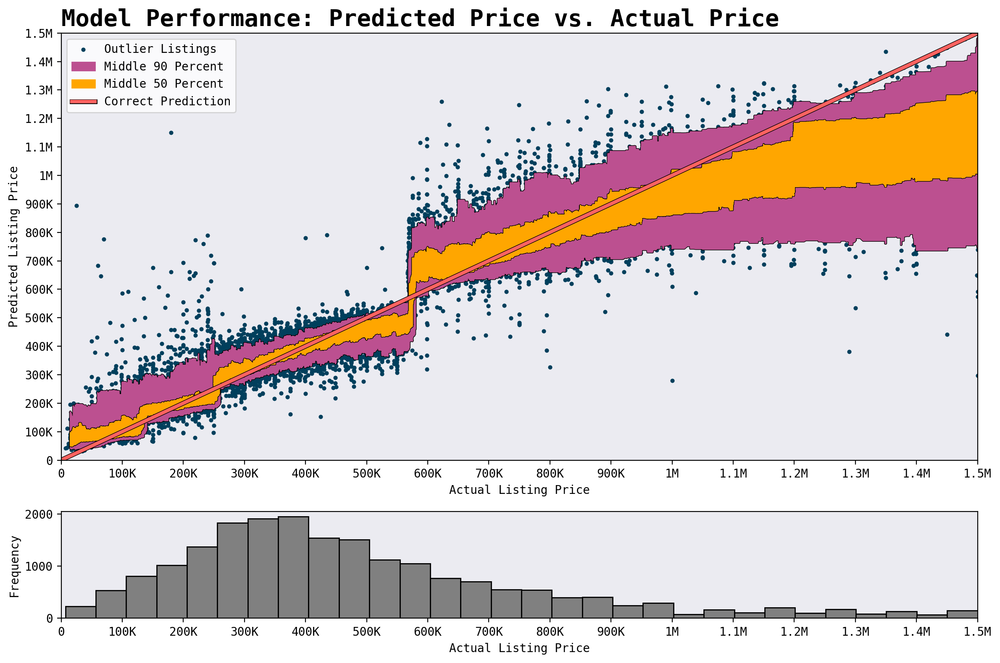

In [21]:
# Plot errors.
plot_errors(y_test, y_pred)

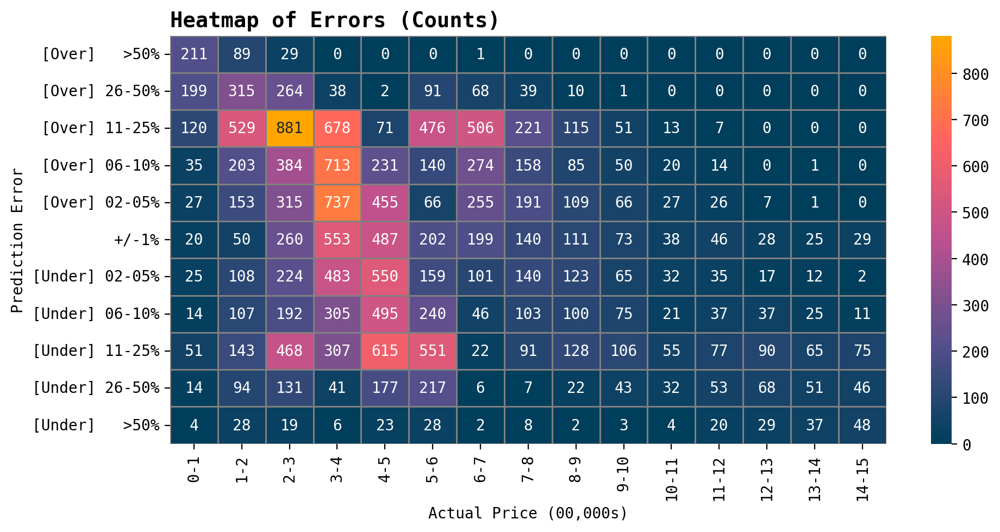

In [22]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

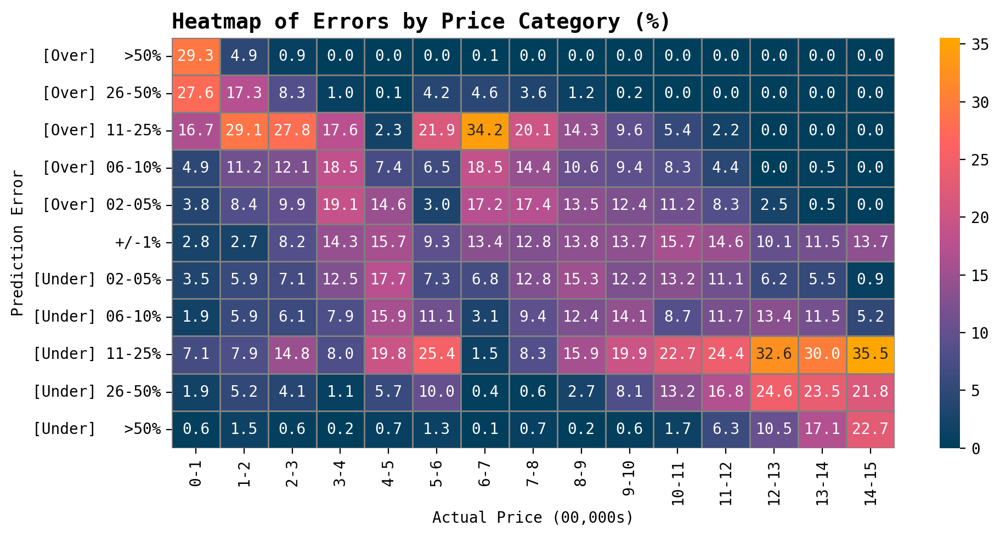

In [23]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

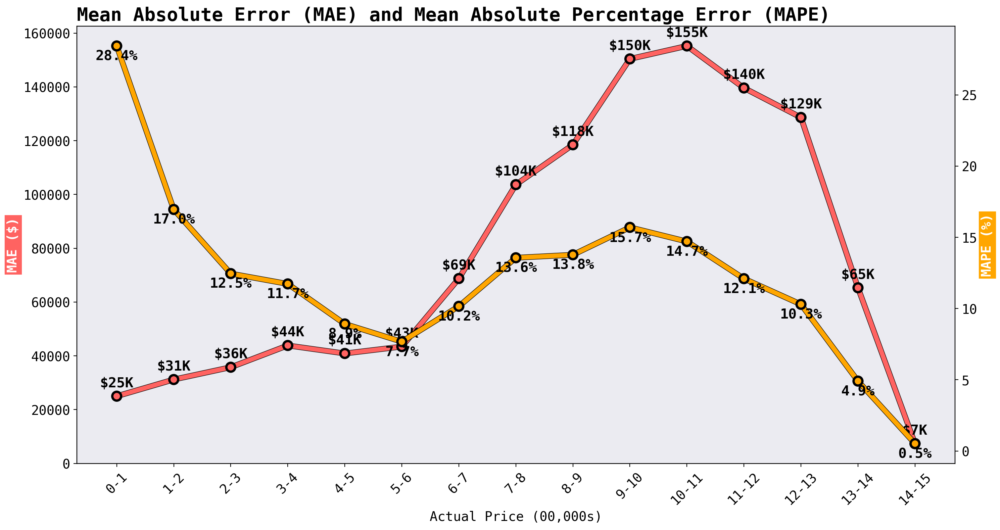

In [24]:
# Plot mape / mae trade off.
plot_errors_mape_vs_mae(y_test, y_pred)

### Version 2

This version brought in a wider set of POI predictors that were found in a second wave of data collection work.

In [16]:
# V2 feature set.
featureSet2 = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned", "rentZestimate", 
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", "hasPatioPorch", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop", "homeType","sewer","City Tier",
    "close_atlantic","close_pacific","in_mountains","riskScore","expectedAnnualLossScore",
    "expectedAnnualLossTotal","socialVulnerabilityScore","resiliencyScore","avalancheAnnualizedFrequency",
    "coastalFloodingAnnualizedFrequency","coldWaveAnnualizedFrequency","droughtAnnualizedFrequency",
    "earthquakeAnnualizedFrequency","hailAnnualizedFrequency","heatWaveAnnualizedFrequency",
    "hurricanAnnualizedFrequency","iceStormAnnualizedFrequency","landslideAnnualizedFrequency",
    "lightningAnnualizedFrequency","riverineFloodingAnnualizedFrequency","strongWindAnnualizedFrequency",
    "tornadoAnnualizedFrequency","tsunamiAnnualizedFrequency","volcanicActivityAnnualizedFrequency",
    "wildFireAnnualizedActivity","winterWeatherAnnualizedFrequency","yearBuilt"
]

In [26]:
# Evaluate the algorithms, save results.
v2_results = evaluate_algorithms(df, featureSet2, algorithms)
v2_results.to_csv('v2_model_results.csv')

100%|██████████| 5/5 [03:15<00:00, 39.04s/it]


In [27]:
# Visualize results.
v2_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

,model,rmse,r2,mae,mape
2,"(ExtraTreeRegressor(random_state=1608637542), ...",94737.300231,0.895571,55840.850298,0.150154
3,"XGBRegressor(base_score=None, booster=None, ca...",94928.339083,0.895149,60137.345445,0.154975
4,LGBMRegressor(random_state=42),100845.543970,0.881671,65137.619021,0.175012
0,LinearRegression(),166748.234020,0.676480,115191.644905,0.363733
1,ElasticNet(random_state=42),174186.360510,0.646973,117501.217275,0.365155


In [28]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v2_results[v2_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(v2_results[v2_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

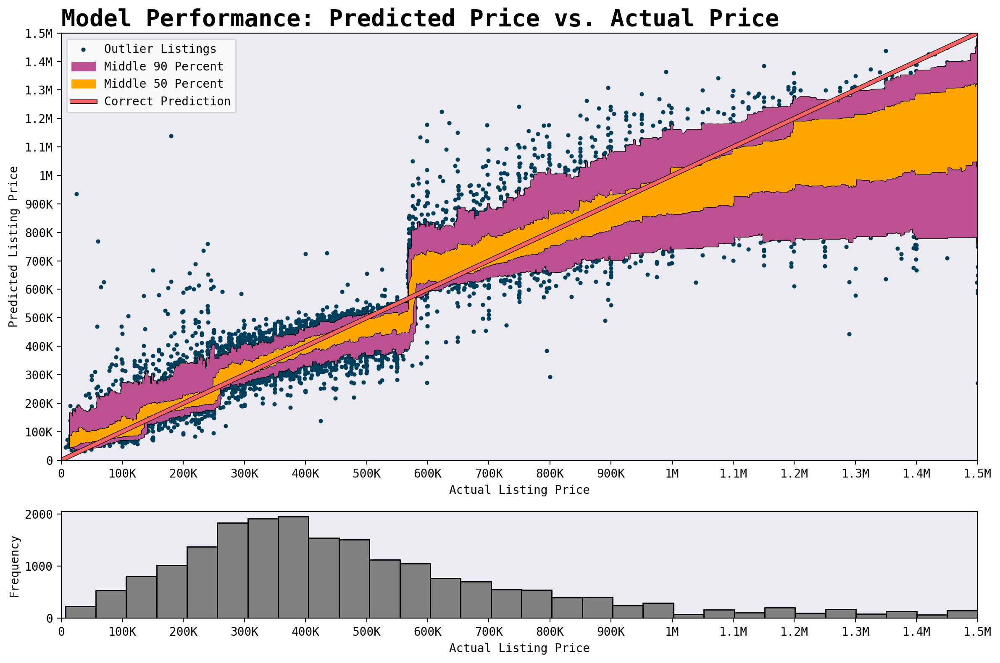

In [29]:
# Plot errors.
plot_errors(y_test, y_pred)

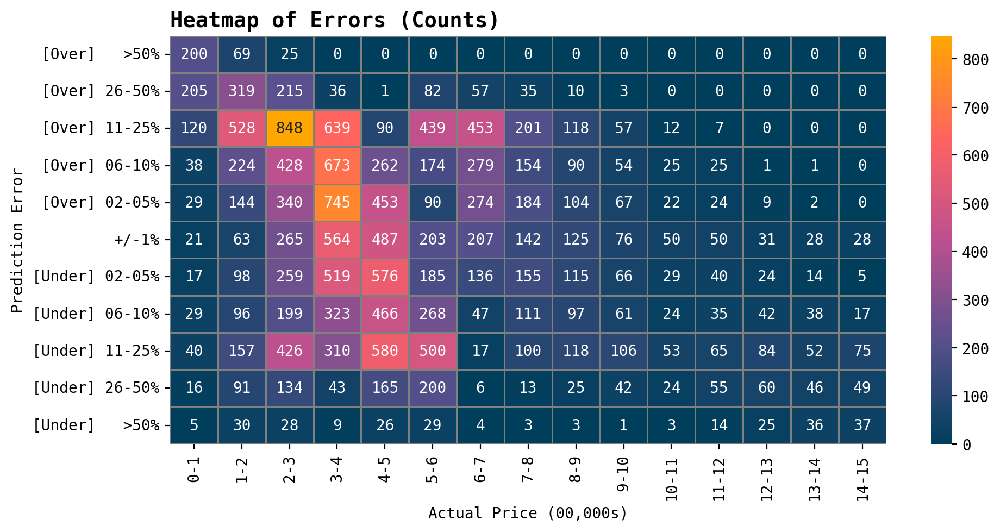

In [30]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

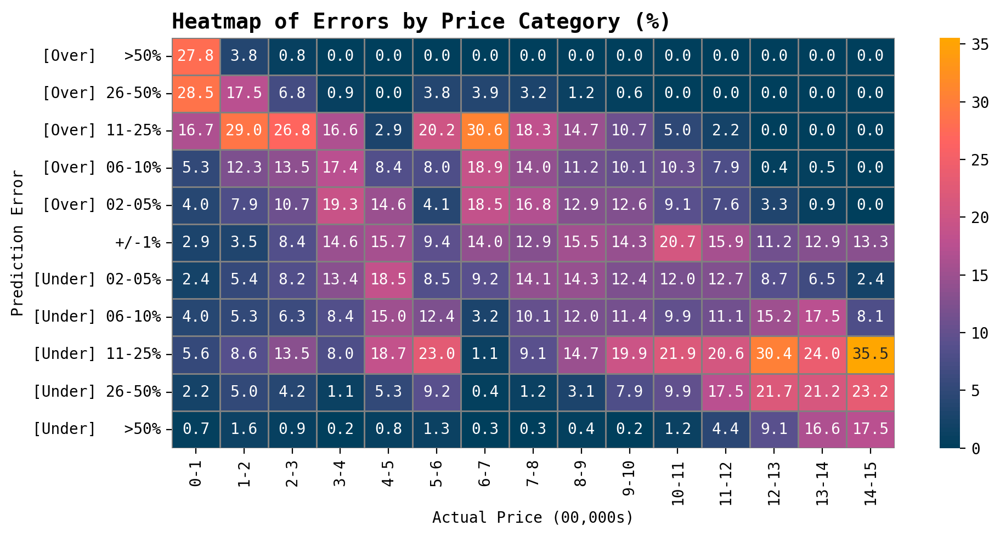

In [31]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

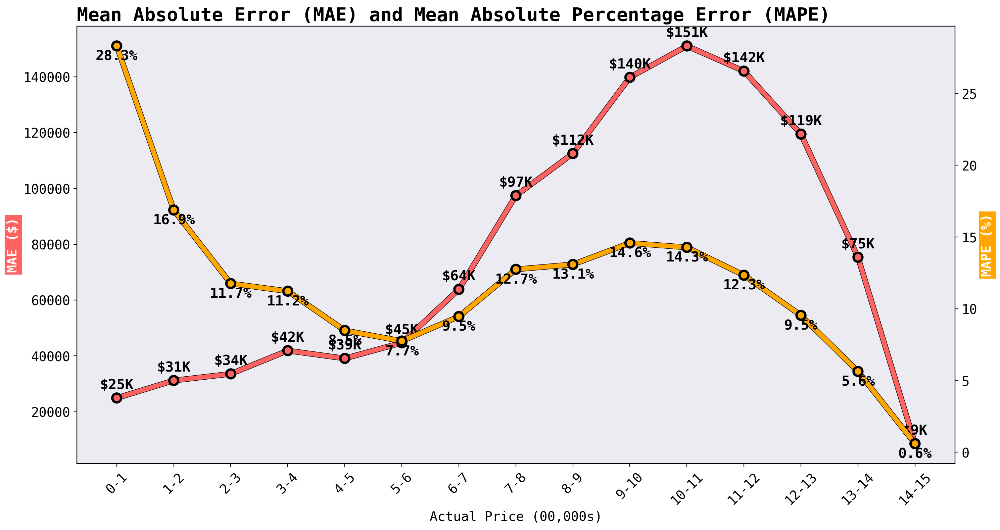

In [32]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred)

### Version 3

This one adds in only a few predictors:

* Comps: Mean price of similar homes within a nearby radius of the listing.
* State: The listing's state.
* City: The listing's city.

In [17]:
#V3 feature set.
featureSet3 = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned", "rentZestimate", 
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", "hasPatioPorch", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop", "homeType","sewer","City Tier",
    "close_atlantic","close_pacific","in_mountains","riskScore","expectedAnnualLossScore",
    "expectedAnnualLossTotal","socialVulnerabilityScore","resiliencyScore","avalancheAnnualizedFrequency",
    "coastalFloodingAnnualizedFrequency","coldWaveAnnualizedFrequency","droughtAnnualizedFrequency",
    "earthquakeAnnualizedFrequency","hailAnnualizedFrequency","heatWaveAnnualizedFrequency",
    "hurricanAnnualizedFrequency","iceStormAnnualizedFrequency","landslideAnnualizedFrequency",
    "lightningAnnualizedFrequency","riverineFloodingAnnualizedFrequency","strongWindAnnualizedFrequency",
    "tornadoAnnualizedFrequency","tsunamiAnnualizedFrequency","volcanicActivityAnnualizedFrequency",
    "wildFireAnnualizedActivity","winterWeatherAnnualizedFrequency","comps","yearBuilt","state_x"
]

In [34]:
# Evaluate the algorithms, save the results.
v3_results = evaluate_algorithms(df, featureSet3, algorithms)
v3_results.to_csv('v3_model_results.csv')

100%|██████████| 5/5 [04:42<00:00, 56.41s/it]]


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13899
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 142
[LightGBM] [Info] Start training from score 487192.446826


In [35]:
# Visualize results.
v3_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",88490.339099,0.908889,55812.590544,0.140638
2,"(ExtraTreeRegressor(random_state=1608637542), ...",89118.990006,0.907590,53009.731653,0.136274
4,LGBMRegressor(random_state=42),92695.331977,0.900024,59708.655063,0.157270
0,LinearRegression(),146456.379004,0.750428,96930.906843,0.292986
1,ElasticNet(random_state=42),155829.914847,0.717459,103154.557755,0.317884


In [36]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v3_results[v3_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(v3_results[v3_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

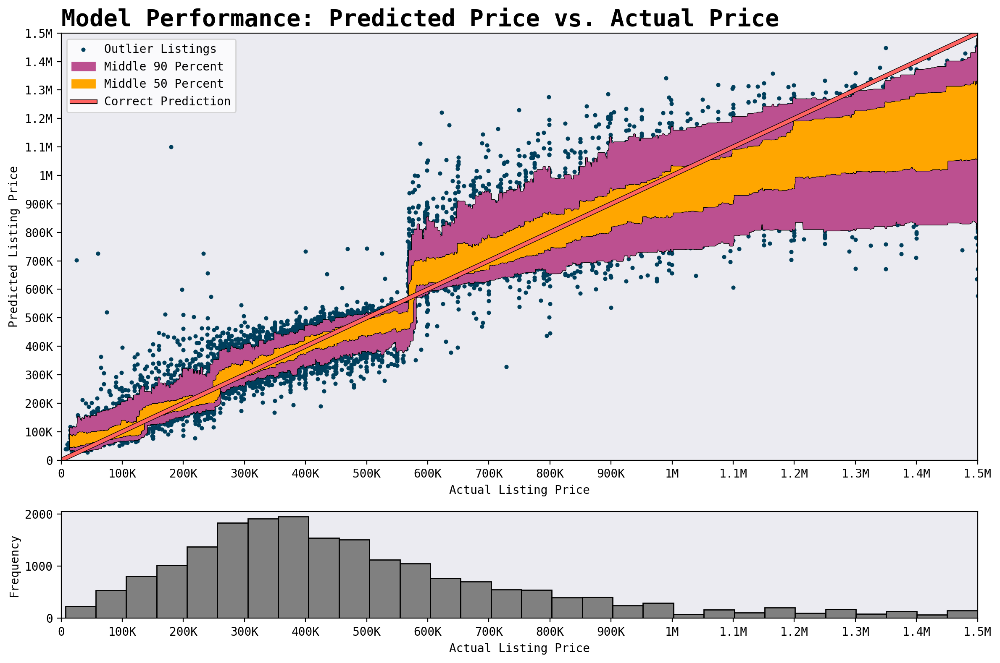

In [37]:
# Plot errors.
plot_errors(y_test, y_pred)

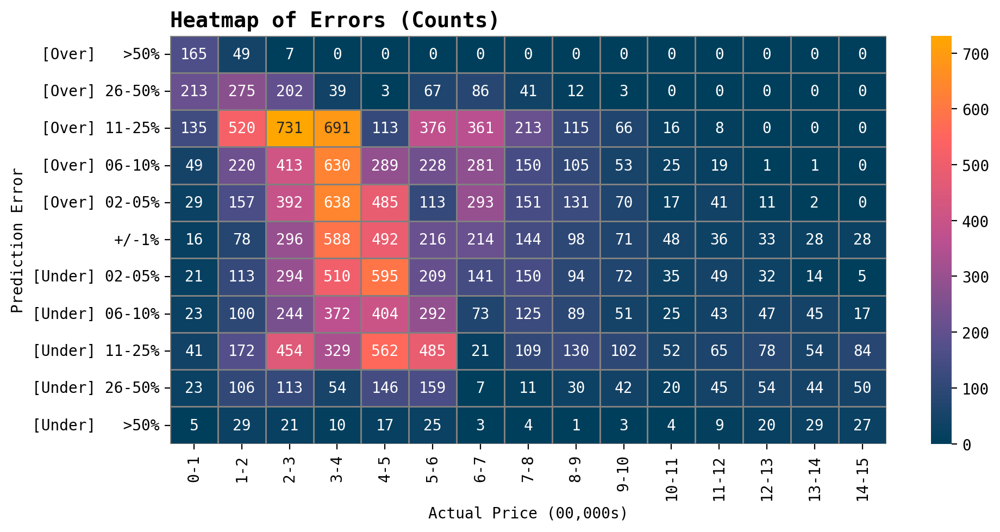

In [38]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

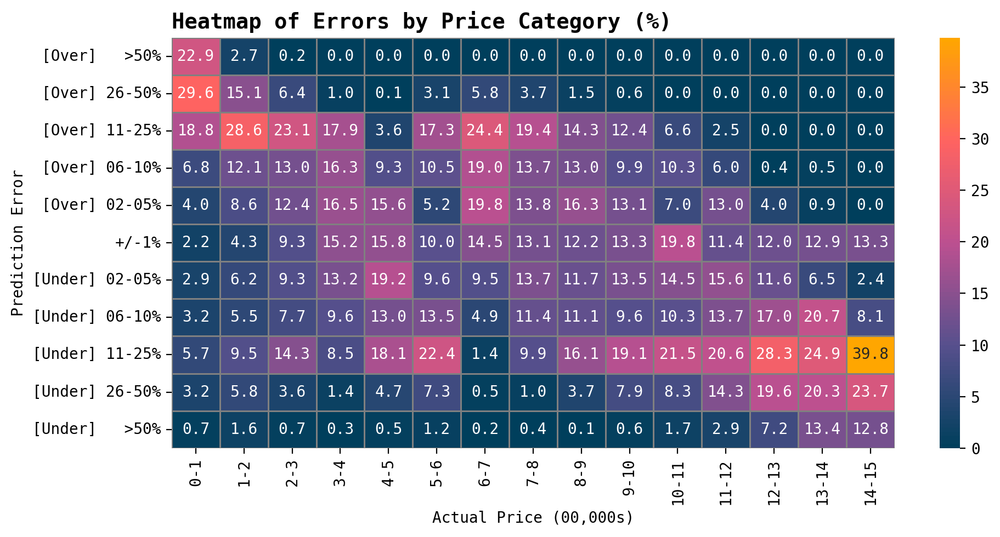

In [39]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

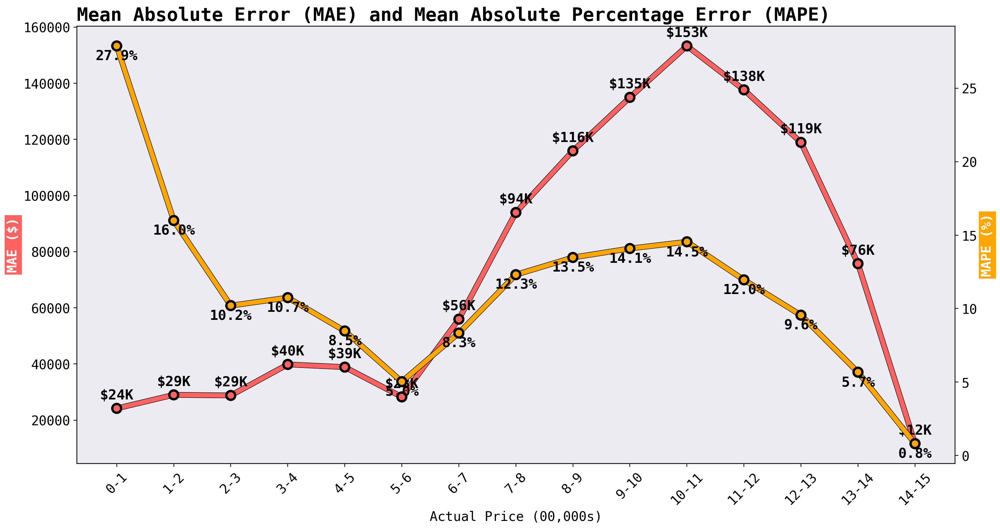

In [40]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

### Version 4

This adds in the image predictors.

In [18]:
#V4 feature set.
featureSet4 = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned", "rentZestimate", 
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", "hasPatioPorch", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop", "homeType","sewer","City Tier",
    "close_atlantic","close_pacific","in_mountains","riskScore","expectedAnnualLossScore",
    "expectedAnnualLossTotal","socialVulnerabilityScore","resiliencyScore","avalancheAnnualizedFrequency",
    "coastalFloodingAnnualizedFrequency","coldWaveAnnualizedFrequency","droughtAnnualizedFrequency",
    "earthquakeAnnualizedFrequency","hailAnnualizedFrequency","heatWaveAnnualizedFrequency",
    "hurricanAnnualizedFrequency","iceStormAnnualizedFrequency","landslideAnnualizedFrequency",
    "lightningAnnualizedFrequency","riverineFloodingAnnualizedFrequency","strongWindAnnualizedFrequency",
    "tornadoAnnualizedFrequency","tsunamiAnnualizedFrequency","volcanicActivityAnnualizedFrequency",
    "wildFireAnnualizedActivity","winterWeatherAnnualizedFrequency","comps","yearBuilt",
    'Bathroom_min_rank','Bedroom_min_rank','Kitchen_min_rank','Living Room_min_rank',	
    'Location Exterior_min_rank','Bathroom_max_rank','Bedroom_max_rank',
    'Kitchen_max_rank','Living Room_max_rank','Location Exterior_max_rank',
    'Bathroom_mean_rank','Bedroom_mean_rank','Kitchen_mean_rank','Living Room_mean_rank',
    'Location Exterior_mean_rank',"state_x"]

In [42]:
# Evaluate the algorithms, save the results.
v4_results = evaluate_algorithms(df, featureSet4, algorithms)
v4_results.to_csv('v4_model_results.csv')

100%|██████████| 5/5 [05:03<00:00, 60.74s/it]]


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14990
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 157
[LightGBM] [Info] Start training from score 487192.446826


In [43]:
# Visualize results.
v4_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",87965.337413,0.909967,55336.443223,0.135461
2,"(ExtraTreeRegressor(random_state=1608637542), ...",89287.427649,0.907240,53653.467014,0.135356
4,LGBMRegressor(random_state=42),91870.789248,0.901795,59019.080925,0.151850
0,LinearRegression(),144745.741325,0.756224,96094.512837,0.285582
1,ElasticNet(random_state=42),154167.690731,0.723455,102950.484378,0.305270


In [44]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v4_results[v4_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(v4_results[v4_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

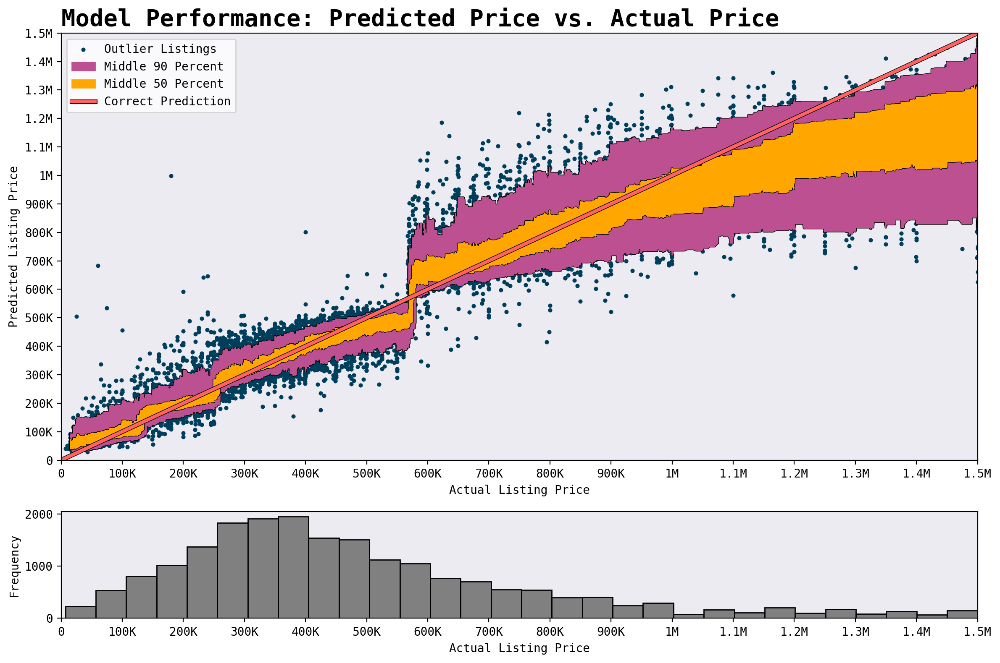

In [45]:
# Plot errors.
plot_errors(y_test, y_pred)

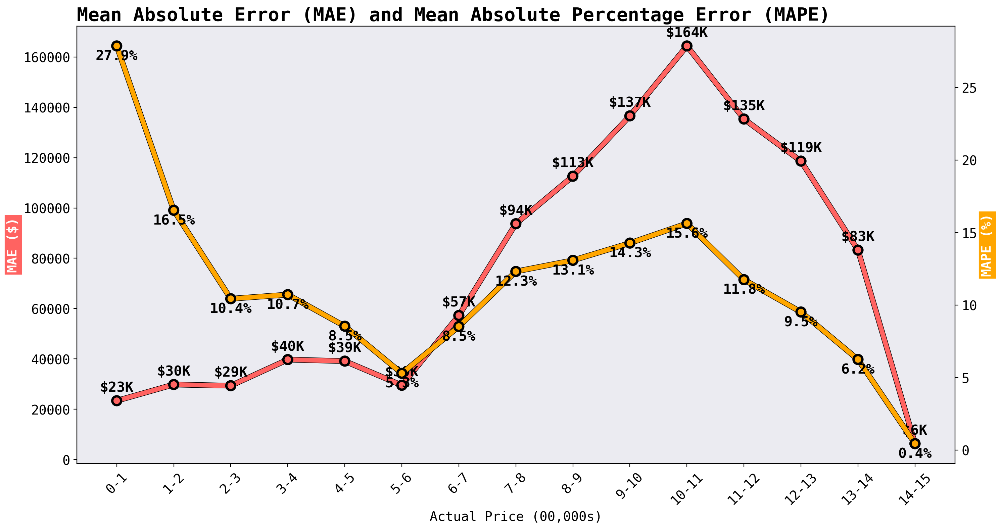

In [46]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

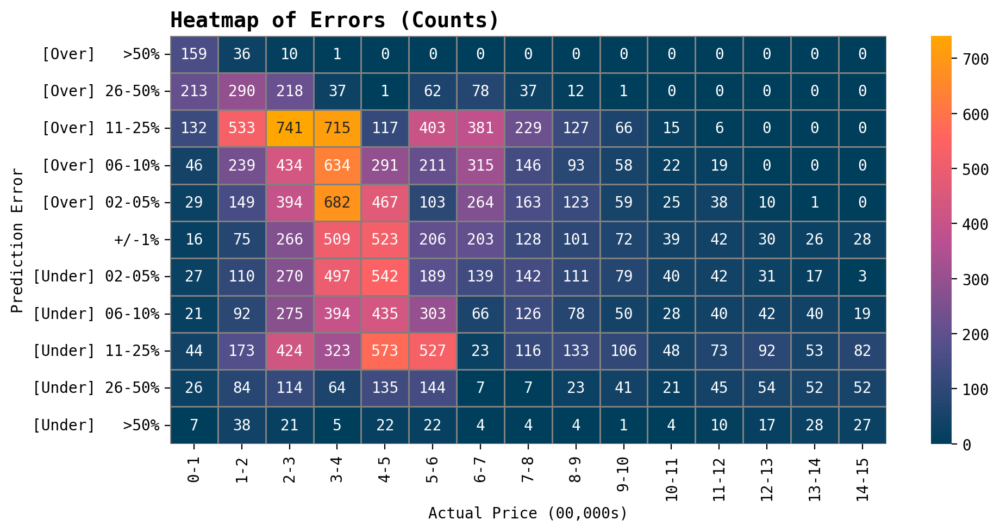

In [47]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

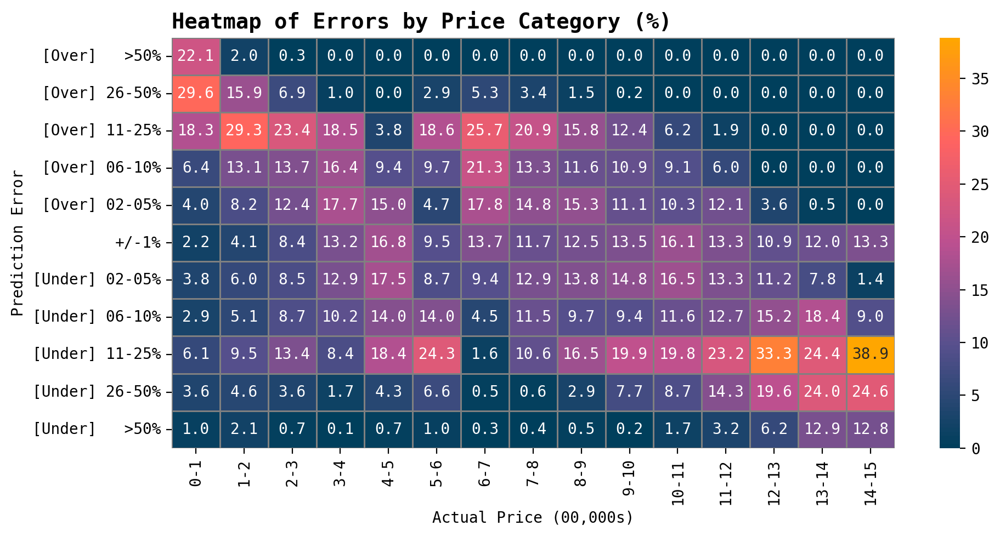

In [48]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

### Version 5

The image features don't seem to help much -- we're going to drop those, effectively bumping us back down to Version 3.

The only other change is removing a predictor called `RentZestimate`. I want to do a quick test to make sure the model is not relying too much on this one feature (spoiler alert: in the feature analysis further down, we see evidence of the potential data leakage -- so we go with V5, which doesn't have `RentZestimate`).

In [19]:
#V5 feature set.
featureSet5 = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned",
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", "hasPatioPorch", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop", "homeType","sewer","City Tier",
    "close_atlantic","close_pacific","in_mountains","riskScore","expectedAnnualLossScore",
    "expectedAnnualLossTotal","socialVulnerabilityScore","resiliencyScore","avalancheAnnualizedFrequency",
    "coastalFloodingAnnualizedFrequency","coldWaveAnnualizedFrequency","droughtAnnualizedFrequency",
    "earthquakeAnnualizedFrequency","hailAnnualizedFrequency","heatWaveAnnualizedFrequency",
    "hurricanAnnualizedFrequency","iceStormAnnualizedFrequency","landslideAnnualizedFrequency",
    "lightningAnnualizedFrequency","riverineFloodingAnnualizedFrequency","strongWindAnnualizedFrequency",
    "tornadoAnnualizedFrequency","tsunamiAnnualizedFrequency","volcanicActivityAnnualizedFrequency",
    "wildFireAnnualizedActivity","winterWeatherAnnualizedFrequency","comps","yearBuilt",
    "state_x"]

In [50]:
# Evaluate the algorithms, save the results.
v5_results = evaluate_algorithms(df, featureSet5, algorithms)
v5_results.to_csv('v5_model_results.csv')

100%|██████████| 5/5 [04:45<00:00, 57.16s/it] 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13644
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 141
[LightGBM] [Info] Start training from score 487192.446826


In [52]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v5_results[v5_results['model_name']=='XGB Regressor']['y_test'].values[0])
y_pred = pickle.loads(v5_results[v5_results['model_name']=='XGB Regressor']['y_pred'].values[0])

In [53]:
# Visualize results.
v5_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",99397.691195,0.885044,62489.588432,0.150605
2,"(ExtraTreeRegressor(random_state=1608637542), ...",100201.607992,0.883177,60150.475231,0.147407
4,LGBMRegressor(random_state=42),102924.896182,0.876741,66271.147825,0.167290
0,LinearRegression(),147754.976687,0.745983,98103.112537,0.294353
1,ElasticNet(random_state=42),157197.713953,0.712478,104537.856427,0.320325


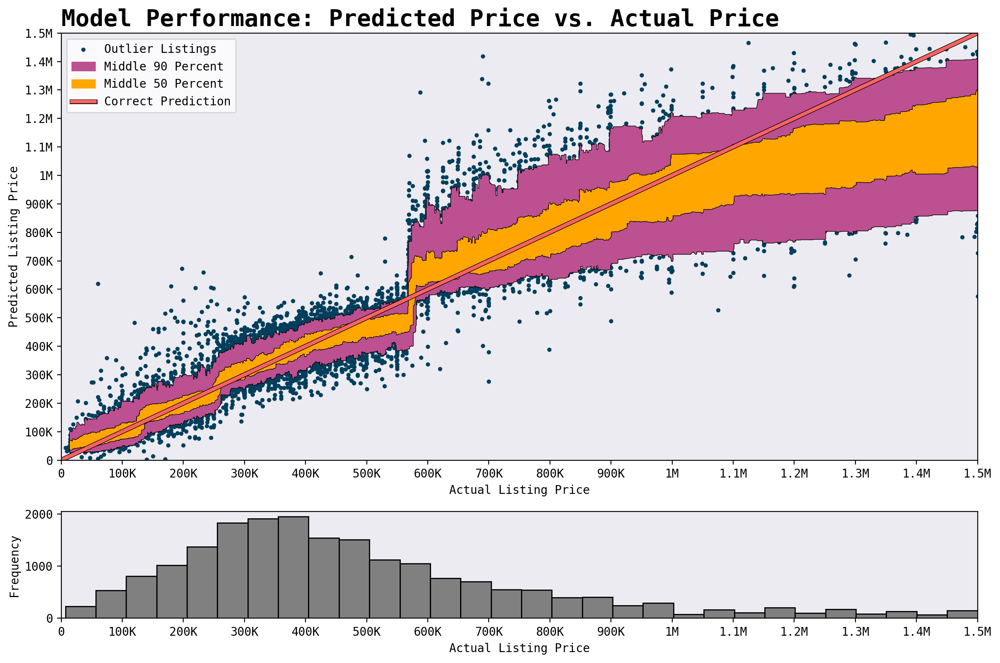

In [54]:
# Plot errors.
plot_errors(y_test, y_pred)

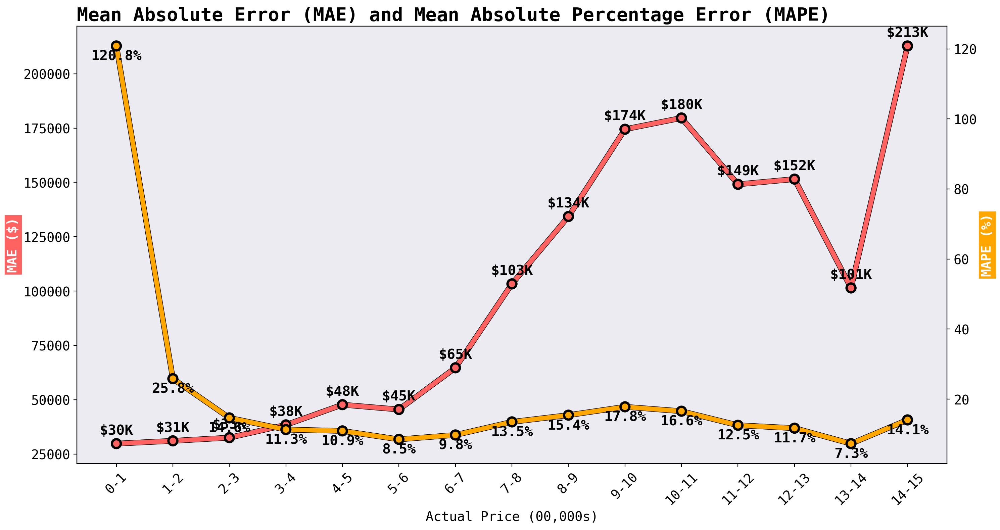

In [55]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

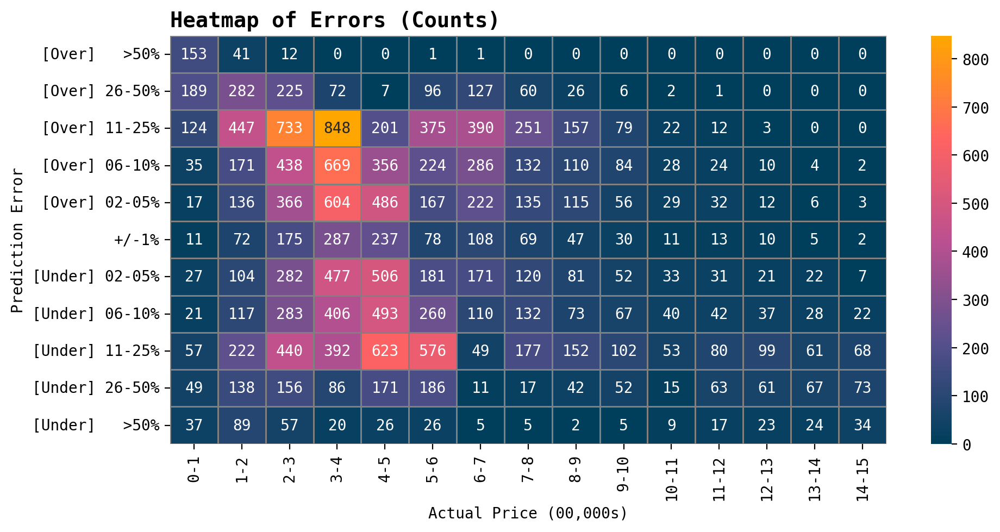

In [56]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

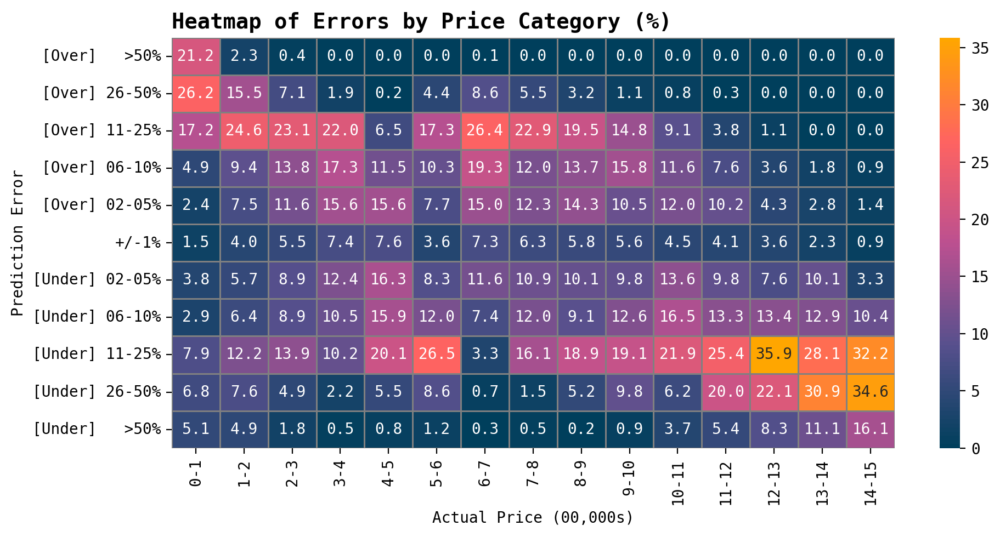

In [57]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

### Tune Final Model

We'll take the final model, Version 5, and tune the hyper parameters.

In [58]:
def tune_xgb_regressor(X_train, y_train, X_test, y_test):
    # Define the XGBRegressor model
    model = xgb.XGBRegressor(random_state=42)

    # Define the parameter grid for hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 5, 7],
        'gamma': [0, 0.1, 0.2],
        'learning_rate': [0.01, 0.05, 0.1],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0],
    }

    # Set up the GridSearchCV with 5-fold cross-validation
    grid_search = GridSearchCV(estimator=model,
                               param_grid=param_grid,
                               scoring='r2',
                               cv=5,
                               verbose=0,
                               n_jobs=-1)

    # Fit the model using the training data
    grid_search.fit(X_train, y_train)

    # Best parameters from grid search
    best_params = grid_search.best_params_

    # Get the best model from grid search
    best_model = grid_search.best_estimator_

    # Predict on the validation data
    y_pred = best_model.predict(X_test)

    # Calculate the performance on validation data
    mae = mean_absolute_error(y_test, y_pred)

    return best_model, best_params, mae

In [59]:
"""
tune_hyperparameters

Wrapper function that tests a list of algorithms against a set of predictors, and compares
the results.

    Args:
        df: the pandas DataFrame with our data for the model.
        feature_set: model predictors.
    Returns:
        Prints the best hyperparameters for the model.
"""

def tune_hyperparameters(df, feature_set):

    # Prepare data
    prepared_data = prepare_data(df, feature_set)
    X, y, features = prepared_data['X'], prepared_data['y'], prepared_data['features']

    # Train test split.
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tune xgb regressor model.
    best_model, best_params, mae = tune_xgb_regressor(X_train, y_train, X_test, y_test)

    # Return results.
    return best_model, best_params, mae

In [60]:
# Hypertune the model.
best_model, best_params, mae = tune_hyperparameters(df, featureSet5)

Best Model: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)


In [61]:
print(f'Best Model: {best_model}')
print(f'Mean Average Error: {mae}')
print(f'Best Params: {best_params}')

Best Model: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)
Mean Average Error: 59255.31545810147
Best Params: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.9}


### Cross-Validation

Now that we have a hypertuned model, we'll now do a 5-fold validation with the final set of predictors and compare the hypertuned model to the un-tuned models we've been using throughout the notebook.

In [20]:
algorithms = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(random_state=42), 'ElasticNet'),
    (ExtraTreesRegressor(random_state=42), 'Extra Trees Regressor'),
    (XGBRegressor(colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, n_estimators=300, subsample=0.8, random_state=42), 'XGB Regressor'), # add hyperparameters
    (LGBMRegressor(random_state=42), 'LGBM Regressor'),
]

In [26]:
"""
cross_validate_model

Perform 5-fold cross-validation on a given model.
    
    Args:
        model: The machine learning model to evaluate.
        X: Feature matrix (input data).
        y: Target vector (labels or continuous values).
        scoring: Scoring metric to evaluate the model. Default is 'accuracy'.
        cv: Number of folds for cross-validation. Default is 5.
        n_jobs: Number of jobs to run in parallel. Default is -1 to use all available processors.
    
    Returns:
        results: Dictionary containing mean score, standard deviation, and individual fold scores.
"""

def cross_validate_model(model, X, y, scoring, cv=5, n_jobs=-1):

# Check if the scoring method is one of the predefined metrics in sklearn
    if scoring == 'neg_mean_absolute_error':
        scoring_method = scoring
    elif scoring == 'neg_root_mean_squared_error':
        scoring_method = 'neg_mean_squared_error'  # RMSE requires MSE scoring first
    elif scoring == 'neg_mean_absolute_percentage_error':
        scoring_method = None  # Custom implementation for MAPE
    else:
        scoring_method = scoring  # For other sklearn predefined metrics (accuracy, r2, etc.)
    
    # Perform cross-validation
    cv_scores = cross_val_score(model, X, y, scoring=scoring_method, cv=cv, n_jobs=n_jobs)
    
    # If using custom scoring (e.g., MAPE), we need to calculate it manually
    if scoring == 'neg_mean_absolute_percentage_error':
        fold_scores = []
        for train_index, test_index in KFold(n_splits=cv).split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            
            # Compute MAPE for this fold
            fold_scores.append(mean_absolute_percentage_error(y_test, y_pred))
        
        # Negate MAPE (since lower MAPE is better and sklearn expects higher values for good metrics)
        cv_scores = np.array(fold_scores) * -1  # Negate MAPE to make it a "maximizing" metric
    elif scoring == 'neg_root_mean_squared_error':
        # Calculate RMSE from MSE
        cv_scores = np.sqrt(-cv_scores)  # Negate because sklearn returns negative MSE for 'neg_mean_squared_error'
    
    # Calculate the mean and standard deviation of the cross-validation scores
    mean_score = np.mean(cv_scores)
    std_score = np.std(cv_scores)

     # Return the results as a dictionary
    results = {
        'model': model,
        'mean_score': mean_score,
        'std_score': std_score,
        'fold_scores': cv_scores
    }
    
    return results

In [22]:
"""
execute_cross_validation

Wrapper function that tests a list of algorithms and returns their cross validation

    Args:
        df: the pandas DataFrame with our data for the model.
        feature_set: model predictors.
        algorithms: the algorithms to test.
    Returns:
        The cross validation scores for the model.
"""

def execute_cross_validation(df, feature_set, algorithms, scoring):

    # Prepare data
    prepared_data = prepare_data(df, feature_set)
    X, y, features = prepared_data['X'], prepared_data['y'], prepared_data['features']

    # Prepare list for the results.
    results = []

    for algo in tqdm(algorithms):

        # Save the model name.
        model_name = algo[1]

        # Tune xgb regressor model.
        vals = cross_validate_model(algo[0], X, y, scoring, cv=5, n_jobs=-1)

        # Append results.
        results.append(vals)

    # Prepare final dataframe.
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by='mean_score',ascending=False)
    
    # Return dataframe.
    return results_df

In [65]:
# r2 cross val.
crossval_r2 = execute_cross_validation(df, featureSet5, algorithms, scoring='r2')
crossval_r2.head()

100%|██████████| 5/5 [05:19<00:00, 63.97s/it] 


,model,mean_score,std_score,fold_scores
3,"XGBRegressor(base_score=None, booster=None, ca...",0.854757,0.026623,"[0.853801233408268, 0.8828495532701389, 0.8798..."
4,LGBMRegressor(random_state=42),0.852254,0.021657,"[0.8528294617301555, 0.8775801108967966, 0.874..."
2,ExtraTreesRegressor(random_state=42),0.844572,0.027061,"[0.8374711649054641, 0.8701325867990315, 0.871..."
1,ElasticNet(random_state=42),0.695236,0.032085,"[0.6958390187072538, 0.716606586381952, 0.7397..."
0,LinearRegression(),-0.706146,2.882481,"[0.7506081639016161, 0.7401091386270856, 0.749..."


In [66]:
# MAE cross val.
crossval_mae = execute_cross_validation(df, featureSet5, algorithms, scoring='neg_mean_absolute_error')
crossval_mae.head()

100%|██████████| 5/5 [05:57<00:00, 71.46s/it] 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.588484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13624
[LightGBM] [Info] Number of data points in the train set: 80077, number of used features: 141
[LightGBM] [Info] Start training from score 495575.412103


,model,mean_score,std_score,fold_scores
3,"XGBRegressor(base_score=None, booster=None, ca...",-69383.810576,8475.689736,"[-75851.55018414203, -59041.25673378845, -6054..."
4,LGBMRegressor(random_state=42),-71970.392285,8186.785775,"[-77748.01906167339, -61296.972406044166, -631..."
2,ExtraTreesRegressor(random_state=42),-72916.545702,9348.374824,"[-81899.11142357643, -62501.356040761275, -637..."
0,LinearRegression(),-103641.599811,8902.017403,"[-106441.94165834166, -94935.98001898197, -981..."
1,ElasticNet(random_state=42),-107073.212841,10068.971612,"[-112226.12563371561, -97026.41459398047, -961..."


In [67]:
# RMSE cross val.
crossval_rmse = execute_cross_validation(df, featureSet5, algorithms, scoring='neg_root_mean_squared_error')
crossval_rmse.head()

100%|██████████| 5/5 [06:19<00:00, 75.94s/it] 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.784637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13593
[LightGBM] [Info] Number of data points in the train set: 80077, number of used features: 141
[LightGBM] [Info] Start training from score 486612.726551
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.553635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13630
[LightGBM] [Info] Number of data points in the train set: 80077, number of used features: 141
[LightGBM] [Info] Start training from score 498177.268591
[LightGBM] [Wa

,model,mean_score,std_score,fold_scores
0,LinearRegression(),282976.114118,271769.753415,"[153825.00512341663, 140077.9447508845, 141460..."
1,ElasticNet(random_state=42),159776.037666,13637.637842,"[169878.1693327341, 146274.67204588806, 144223..."
2,ExtraTreesRegressor(random_state=42),114037.780580,14114.625480,"[124179.82206354204, 99020.3260016664, 101272...."
4,LGBMRegressor(random_state=42),111136.642738,11332.928302,"[118167.01392096489, 96139.14327556493, 99982...."
3,"XGBRegressor(base_score=None, booster=None, ca...",110166.249524,13768.729430,"[117776.23752659629, 94047.27821517906, 98004...."


In [27]:
# MAPE cross val.
crossval_mape = execute_cross_validation(df, featureSet5, algorithms, scoring='neg_mean_absolute_percentage_error')
crossval_mape.head()

100%|██████████| 5/5 [24:31<00:00, 294.26s/it]


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13516
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 141
[LightGBM] [Info] Start training from score 462753.480656
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13589
[LightGBM] [Info] Number of data points in the train set: 80077, number of used features: 141
[LightGBM] [Info] Start training from score 493128.619241
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the 

,model,mean_score,std_score,fold_scores
3,"XGBRegressor(base_score=None, booster=None, ca...",-0.165320,0.038296,"[-0.12910239597492404, -0.13368867259680117, -..."
2,"(ExtraTreeRegressor(random_state=1608637542), ...",-0.178662,0.048019,"[-0.1382903624757186, -0.13795157772442568, -0..."
4,LGBMRegressor(random_state=42),-0.185660,0.048244,"[-0.13895589875521497, -0.1473765525315172, -0..."
0,LinearRegression(),-0.317300,0.087405,"[-0.21252714010821444, -0.25587834017898187, -..."
1,ElasticNet(random_state=42),-0.328108,0.104144,"[-0.21919589408259768, -0.25789899962765084, -..."


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13516
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 141
[LightGBM] [Info] Start training from score 462753.480656
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.645005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13593
[LightGBM] [Info] Number of data points in the train set: 80077, number of used features: 141
[LightGBM] [Info] Start training from score 486612.726551
[LightGBM] [Warning] Found whitespace in feature_names, replace with underline

### Ablation Studies

I want to get some intuition on how much different buckets of predictors are contributing to the model. To do this, we'll do an ablation study.

What I'll do is run the model a few more times on:
* Only listing data.
* Only POI data.
* Only image data.

And see how good of a model each of these clusters of predictors can achieve in isolation.

Based on what I've seen so far, I'm expecting listing and POI data will do well, but image data will do poorly.

##### Ablation: Listing Data Only

In [70]:
listingOnly = [
    "bedrooms", "bathrooms", "livingArea", "hasGarage", "parkingCapacity", 
    "hasHeating", "fireplaces", "hasWaterfrontView", "isSeniorCommunity", 
    "lotSize", "hoaFee", "buyersFeePerc", "daysOnZillow", "views", "favorites", 
    "percSellFaster", "propertyTax", "mortgageRate", "agentRecentSales", 
    "agentReviewsCount", "isForeclosure", "isBankOwned","homeType",
    "totalActualRent", "termsCash", "termsConventional", "termsFHA", "termsVA", 
    "hasPatioPorch","sewer","yearBuilt"]

In [71]:
# Evaluate the algorithms, save the results.
listingOnly_results = evaluate_algorithms(df, listingOnly, algorithms)
listingOnly_results.to_csv('listingonly_model_results.csv')

# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(listingOnly_results[listingOnly_results['model_name']=='XGB Regressor']['y_test'].values[0])
y_pred = pickle.loads(listingOnly_results[listingOnly_results['model_name']=='XGB Regressor']['y_pred'].values[0])

# Visualize results.
listingOnly_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

100%|██████████| 5/5 [00:58<00:00, 11.60s/it]


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2792
[LightGBM] [Info] Number of data points in the train set: 80076, number of used features: 33
[LightGBM] [Info] Start training from score 487192.446826


,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",125186.111370,0.817656,81357.225943,0.223406
2,"(ExtraTreeRegressor(random_state=1608637542), ...",131538.351644,0.798681,81065.126449,0.232843
4,LGBMRegressor(random_state=42),136420.376871,0.783460,91458.902849,0.257226
0,LinearRegression(),186248.850484,0.596386,130169.835840,0.426504
1,ElasticNet(random_state=42),195148.186242,0.556893,133767.860661,0.436809


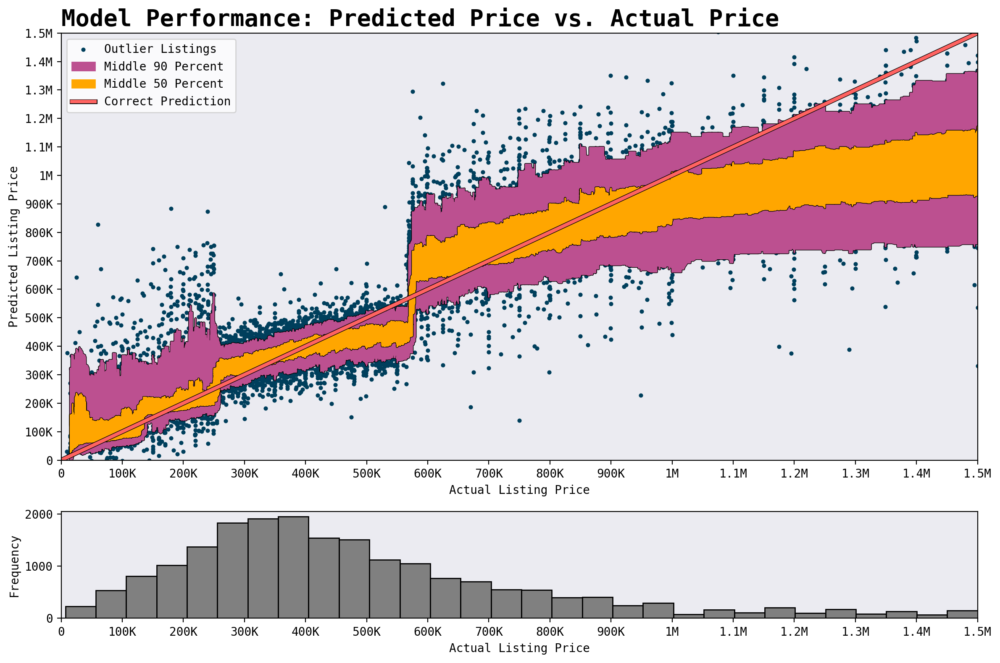

In [72]:
# Plot errors.
plot_errors(y_test, y_pred)

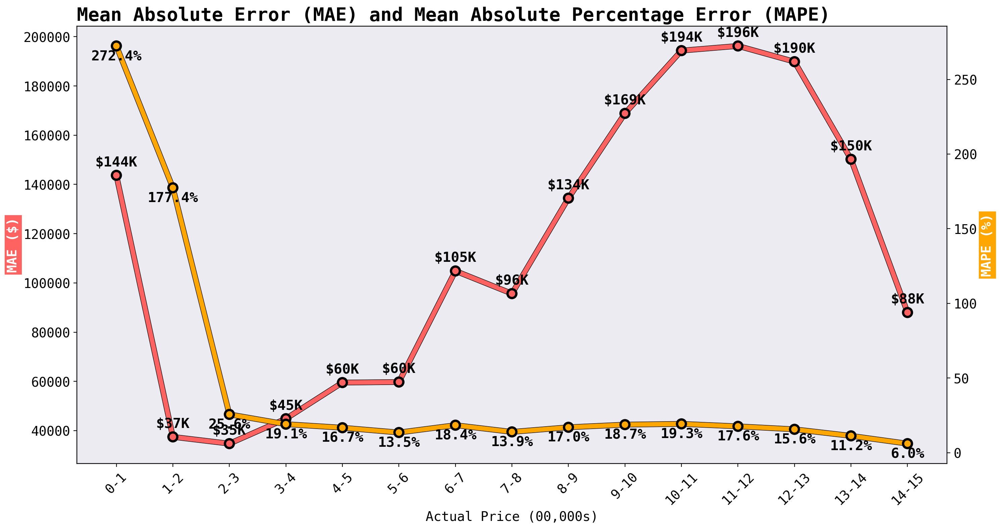

In [73]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

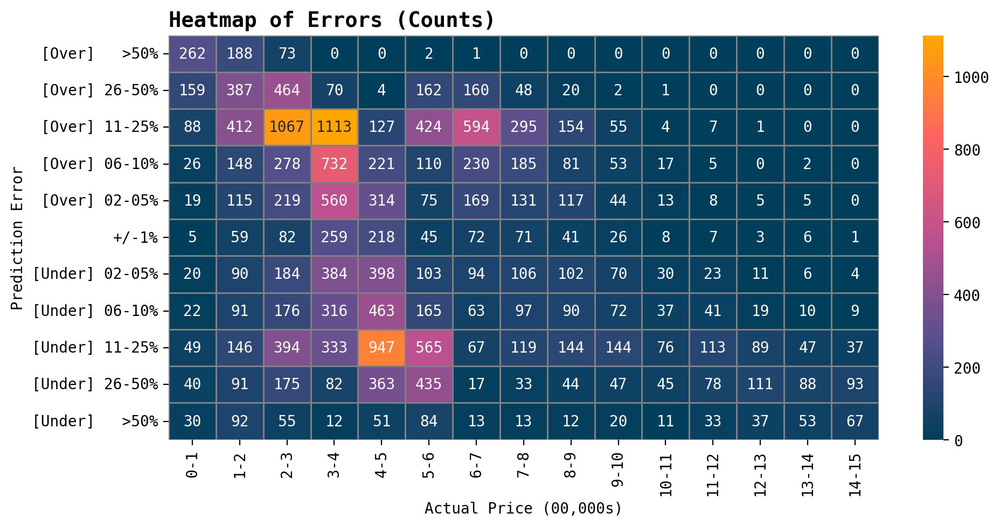

In [74]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

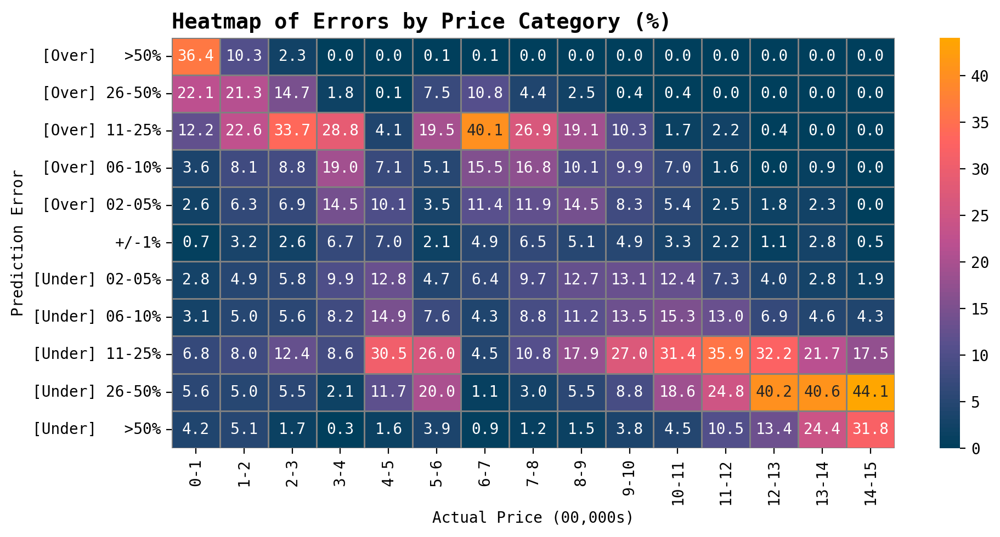

In [75]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

##### Ablation: POI Data Only

In [76]:
poiOnly = [
    "schoolAverageDistance", "schoolContainsCharter", "schoolRatingMiddleSchool", 
    "schoolRatingHighSchool", "schoolRatingElementary", 
    "national_park", "post_office", "tiny_museum", "small_museum", "medium_museum", 
    "large_museum", "massive_museum", "top_trail", "hidden_gem_trail", 
    "tougth_to_love_trail", "under_the_radar_trail", "prison", "clean_power_plant", 
    "dirty_power_plant", "police_station", "most_serious_crimes_per_capita", 
    "serious_crimes_per_capita", "less_serious_crimes_per_capita", 
    "total_stolen_value_per_capita", "2022_county_pop","City Tier",
    "close_atlantic","close_pacific","in_mountains","riskScore","expectedAnnualLossScore",
    "expectedAnnualLossTotal","socialVulnerabilityScore","resiliencyScore","avalancheAnnualizedFrequency",
    "coastalFloodingAnnualizedFrequency","coldWaveAnnualizedFrequency","droughtAnnualizedFrequency",
    "earthquakeAnnualizedFrequency","hailAnnualizedFrequency","heatWaveAnnualizedFrequency",
    "hurricanAnnualizedFrequency","iceStormAnnualizedFrequency","landslideAnnualizedFrequency",
    "lightningAnnualizedFrequency","riverineFloodingAnnualizedFrequency","strongWindAnnualizedFrequency",
    "tornadoAnnualizedFrequency","tsunamiAnnualizedFrequency","volcanicActivityAnnualizedFrequency",
    "wildFireAnnualizedActivity","winterWeatherAnnualizedFrequency","comps","state_x"]

In [77]:
# Evaluate the algorithms, save the results.
poiOnly_results = evaluate_algorithms(df, poiOnly, algorithms)
poiOnly_results.to_csv('poionly_model_results.csv')

# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(poiOnly_results[poiOnly_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(poiOnly_results[poiOnly_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

# Visualize results.
poiOnly_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

100%|██████████| 5/5 [02:48<00:00, 33.76s/it]


,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",147009.249327,0.748540,93712.630732,0.248167
4,LGBMRegressor(random_state=42),151159.338798,0.734142,97270.551534,0.260235
2,"(ExtraTreeRegressor(random_state=1608637542), ...",152685.247204,0.728748,92843.307692,0.246018
0,LinearRegression(),190279.149652,0.578729,121702.127522,0.360905
1,ElasticNet(random_state=42),202128.393479,0.524628,142504.021006,0.472326


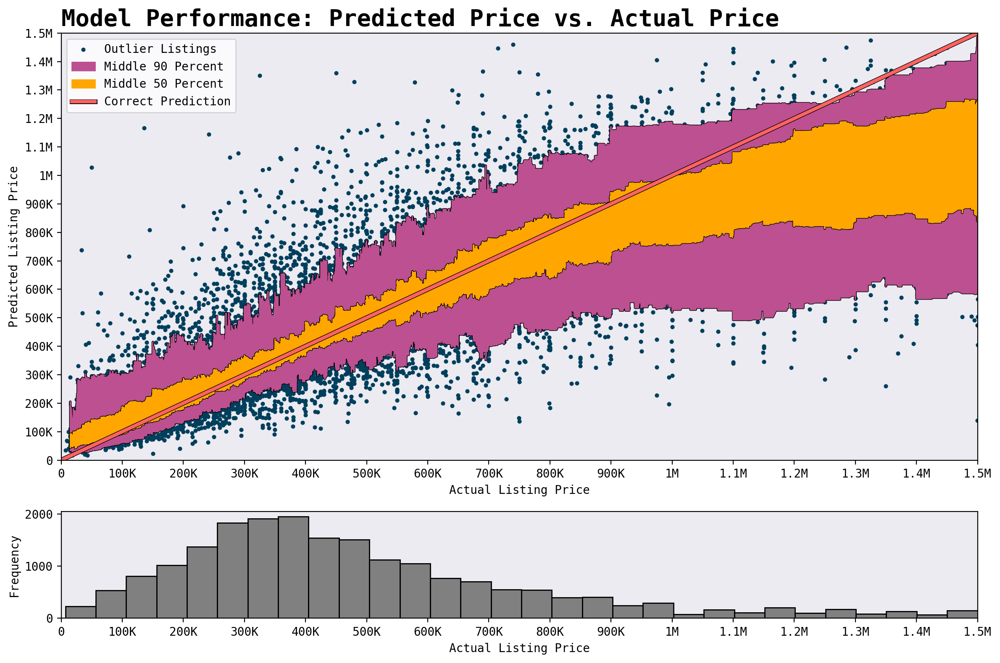

In [78]:
# Plot errors.
plot_errors(y_test, y_pred)

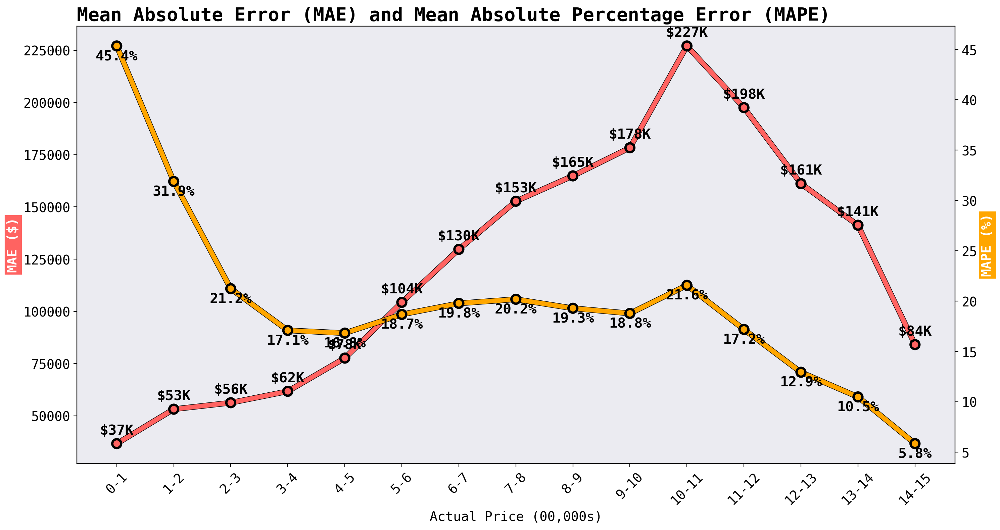

In [79]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

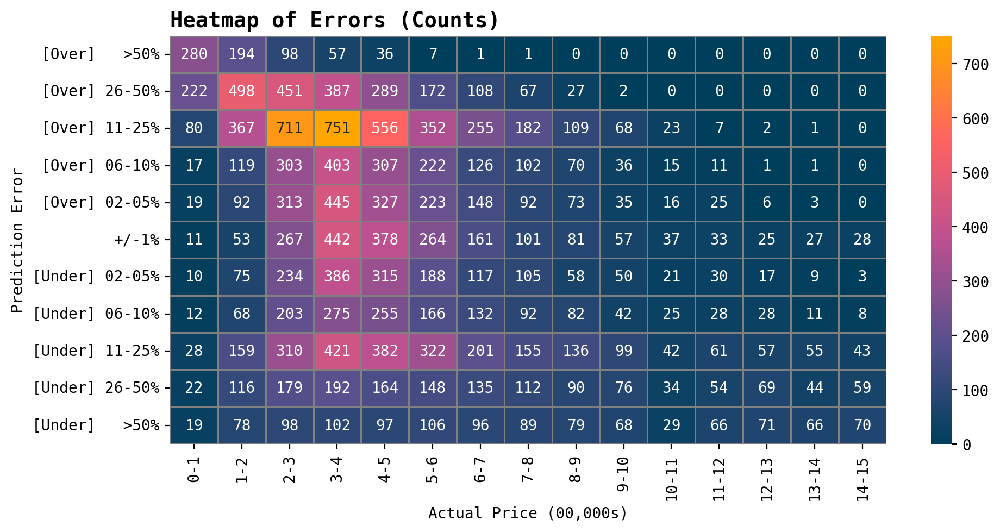

In [80]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

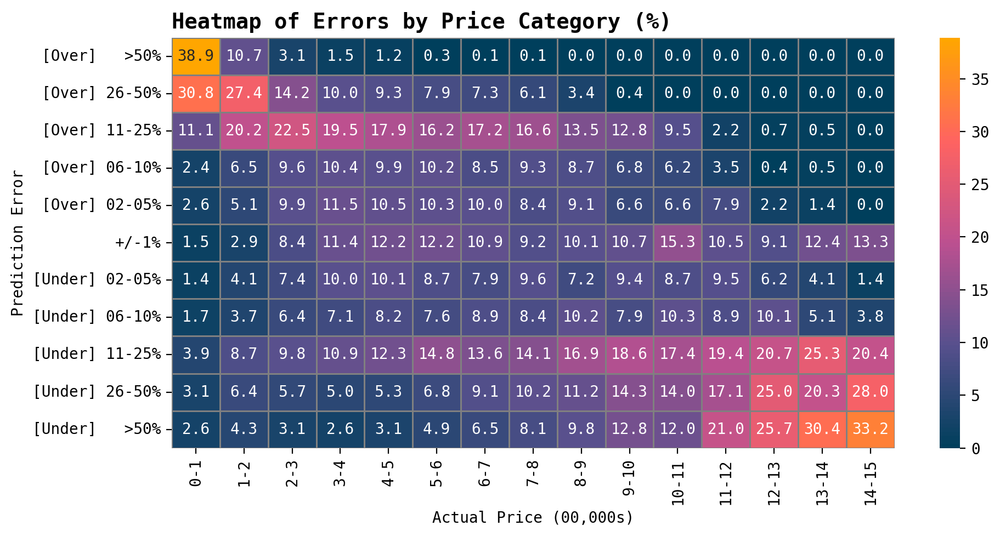

In [81]:
# Plot heatmap (percentage).
plot_errors_heatmap(y_test, y_pred, pct=True)

##### Ablation: Image Data Only

In [82]:
imageOnly = [
    'Location Exterior_min_rank','Bathroom_max_rank','Bedroom_max_rank',
    'Kitchen_max_rank','Living Room_max_rank','Location Exterior_max_rank',
    'Bathroom_mean_rank','Bedroom_mean_rank','Kitchen_mean_rank','Living Room_mean_rank',
    'Location Exterior_mean_rank']

In [83]:
# Evaluate the algorithms, save the results.
imageOnly_results = evaluate_algorithms(df, imageOnly, algorithms)
imageOnly_results.to_csv('imageonly_model_results.csv')

# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(imageOnly_results[imageOnly_results['model_name']=='Extra Trees Regressor']['y_test'].values[0])
y_pred = pickle.loads(imageOnly_results[imageOnly_results['model_name']=='Extra Trees Regressor']['y_pred'].values[0])

# Visualize results.
imageOnly_results[['model','rmse','r2','mae','mape']].sort_values(by='r2',ascending=False)

100%|██████████| 5/5 [00:17<00:00,  3.49s/it]


,model,rmse,r2,mae,mape
3,"XGBRegressor(base_score=None, booster=None, ca...",257676.609389,0.227445,191091.077353,0.605580
4,LGBMRegressor(random_state=42),258320.830689,0.223577,191951.993536,0.611858
2,"(ExtraTreeRegressor(random_state=1608637542), ...",262166.913972,0.200285,191834.256999,0.615405
0,LinearRegression(),269361.947806,0.155787,202648.154520,0.657714
1,ElasticNet(random_state=42),271217.585335,0.144116,204501.575564,0.676329


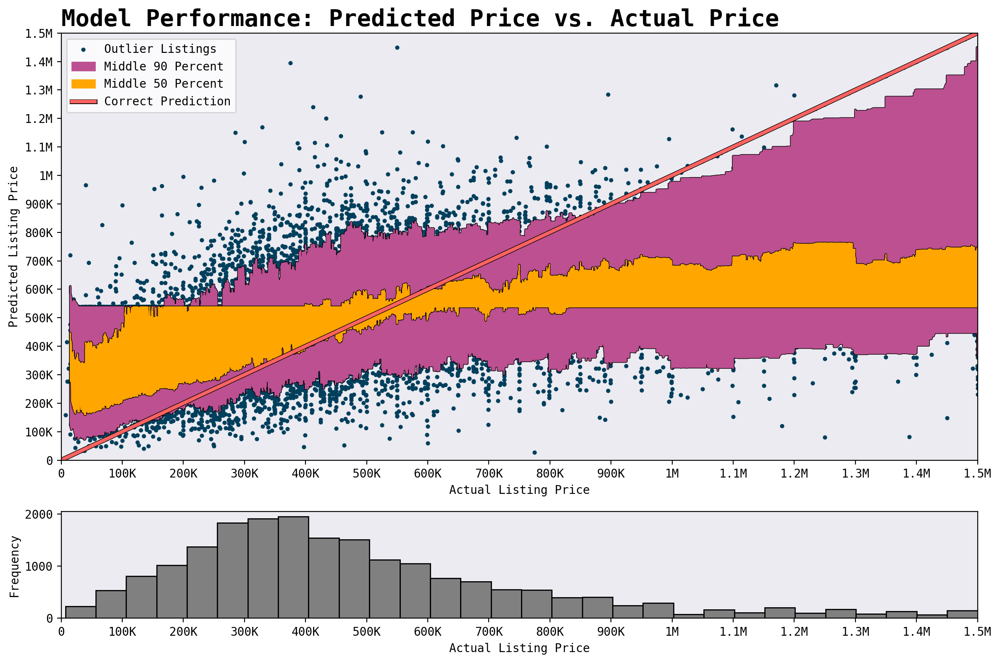

In [84]:
# Plot errors.
plot_errors(y_test, y_pred)

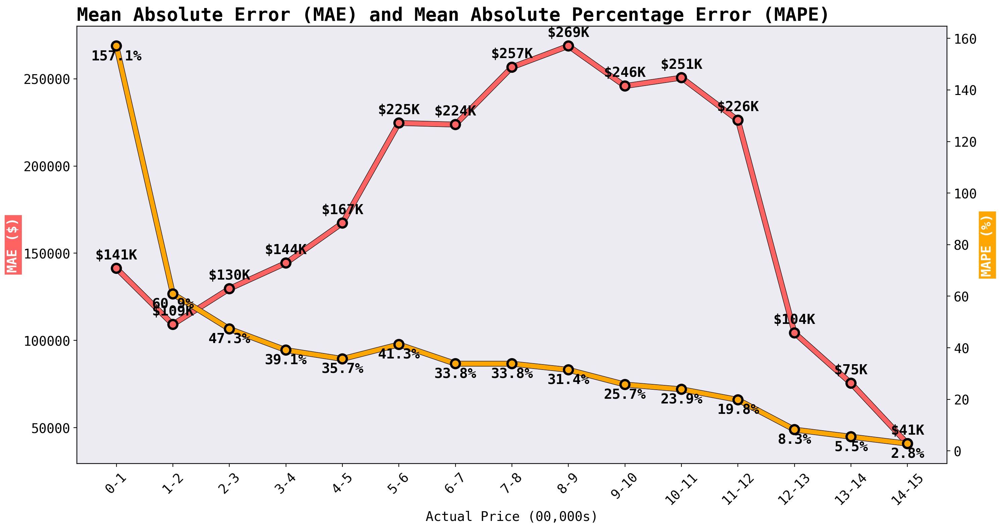

In [85]:
# Plot mae / mape trade off.
plot_errors_mape_vs_mae(y_test, y_pred, bins=15)

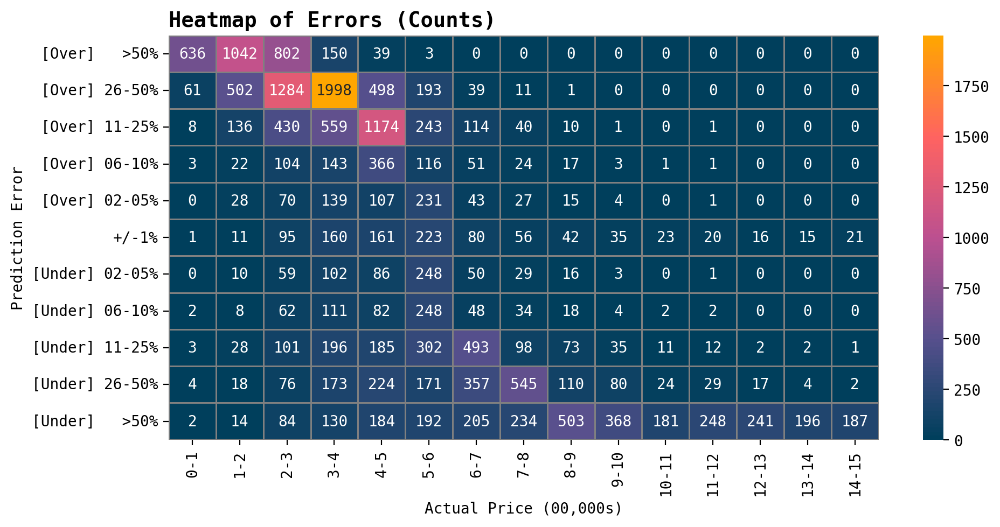

In [86]:
# Plot heatmap.
plot_errors_heatmap(y_test, y_pred)

### Feature Importance Analysis

I'd like to do one final pass under the hood and see the feature importance analysis for versions 1-5. This will help me answer the question, "what factors are most important (for this model, at least) in predicting the list price of a home?"

In [87]:
"""
determine_feature_importance

    Determine feature importance for a given model.

    Args:
        model: Trained scikit-learn model or compatible estimator.
        X: pandas DataFrame or numpy array of input features.
        y: pandas Series or numpy array of target variable.
        feature_names: List of feature names.
        method: str, "model" for model-based importance, "permutation" for permutation importance.
        plot: bool, if True, plot the feature importances.

    Returns:
        feature_importances: pandas DataFrame with feature names and importances.
"""

def determine_feature_importance(model, X, y, feature_names, method="permutation", plot=True):

    feature_names = X.columns
    
    if method == "model":
        # Use built-in model feature importance if available
        if hasattr(model, "feature_importances_"):
            importances = model.feature_importances_
        elif hasattr(model, "coef_"):
            importances = np.abs(model.coef_)
            importances = importances.ravel() if importances.ndim > 1 else importances
        else:
            raise ValueError("Model does not have feature_importances_ or coef_. Use 'permutation' method.")

    elif method == "permutation":
        # Use permutation importance
        perm_importance = permutation_importance(model, X, y, n_repeats=3, random_state=42, n_jobs=-1)
        importances = perm_importance.importances_mean
        importances_std = perm_importance.importances_std

    else:
        raise ValueError("Invalid method. Use 'model' or 'permutation'.")
    
    # Create DataFrame for feature importances
    feature_importances = pd.DataFrame({
        "Feature": feature_names,
        "Importance": importances,
        "Importance Standard Deviation": importances_std
    }).sort_values(by="Importance", ascending=False)

    return feature_importances

In [88]:
"""
run_feature_importance

Wrapper to connect feature importance to the rest of the ML workflow.

    Args:
        * df: the dataset.
        * feature_set: the predictors.
        * Algorithm: a tuple of the model and model name.
    
    Returns:
        * pandas DataFrame generated by the function `determine_feature_importance`.

"""

def run_feature_importance(df, feature_set, algorithms):
    
    # Empty list to store results.
    results = []

    # Prepare data
    prepared_data = prepare_data(df, feature_set)
    X, y, features = prepared_data['X'], prepared_data['y'], prepared_data['features']

    # For each algorithm,
    for algo in tqdm(algorithms):
        
        # Save the model name.
        model_name = algo[1]
        
        # Evaluate the model's performance.
        evaluation = train_and_evaluate_model(X, y, algo[0], features)

        # Determine importance features.
        feature_importance = determine_feature_importance(model=evaluation['model'], X=X, y=y, feature_names=features)
        return feature_importance

In [89]:
# Define the final model to keep the code simple. 
final_model = XGBRegressor(colsample_bytree=0.9, gamma=0, learning_rate=0.1, max_depth=7, n_estimators=300, subsample=0.8, random_state=42)


In [90]:
feat1 = run_feature_importance(df, featureSet1, algorithms=[(final_model, 'XGB Regressor')])
feat1.head(20)

  0%|          | 0/1 [00:15<?, ?it/s]


,Feature,Importance,Importance Standard Deviation
17,mortgageRate,0.514111,0.001382
22,rentZestimate,0.190595,0.000798
9,lotSize,0.058253,0.000365
2,livingArea,0.036420,0.000105
16,propertyTax,0.027931,0.000048
40,massive_museum,0.027514,0.000021
42,hidden_gem_trail,0.023053,0.000153
14,favorites,0.020689,0.000326
53,2022_county_pop,0.020560,0.000118
1,bathrooms,0.019050,0.000116


In [91]:
feat2 = run_feature_importance(df, featureSet2, algorithms=[(final_model, 'XGB Regressor')])
feat2.head(20)

  0%|          | 0/1 [00:28<?, ?it/s]


,Feature,Importance,Importance Standard Deviation
17,mortgageRate,0.502326,0.001216
22,rentZestimate,0.166681,0.000769
9,lotSize,0.067411,0.000170
2,livingArea,0.041277,0.000225
1,bathrooms,0.019806,0.000042
64,hailAnnualizedFrequency,0.017269,0.000084
77,yearBuilt,0.016595,0.000158
14,favorites,0.015242,0.000264
32,schoolRatingElementary,0.012557,0.000185
69,lightningAnnualizedFrequency,0.009492,0.000126


In [92]:
feat3 = run_feature_importance(df, featureSet3, algorithms=[(final_model, 'XGB Regressor')])
feat3.head(20)

  0%|          | 0/1 [00:39<?, ?it/s]


,Feature,Importance,Importance Standard Deviation
17,mortgageRate,0.451595,0.001752
77,comps,0.164514,0.000934
22,rentZestimate,0.107026,0.000882
9,lotSize,0.058428,0.000204
1,bathrooms,0.013955,0.000102
78,yearBuilt,0.012880,0.000164
31,schoolRatingHighSchool,0.009102,0.000056
14,favorites,0.008980,0.000095
139,state_x_WA,0.008091,0.000282
69,lightningAnnualizedFrequency,0.006770,0.000189


In [93]:
feat4 = run_feature_importance(df, featureSet4, algorithms=[(final_model, 'XGB Regressor')])
feat4.head(20)

  0%|          | 0/1 [00:49<?, ?it/s]


,Feature,Importance,Importance Standard Deviation
17,mortgageRate,0.412376,0.001400
77,comps,0.159786,0.000807
22,rentZestimate,0.103985,0.001316
9,lotSize,0.063867,0.000023
14,favorites,0.022137,0.000193
1,bathrooms,0.011338,0.000046
78,yearBuilt,0.011067,0.000066
13,views,0.010513,0.000083
31,schoolRatingHighSchool,0.006966,0.000088
69,lightningAnnualizedFrequency,0.006470,0.000188


In [94]:
feat5 = run_feature_importance(df, featureSet5, algorithms=[(final_model, 'XGB Regressor')])
feat5.head(20)

  0%|          | 0/1 [00:38<?, ?it/s]


,Feature,Importance,Importance Standard Deviation
17,mortgageRate,0.451956,0.002097
76,comps,0.254589,0.001288
9,lotSize,0.095803,0.000088
1,bathrooms,0.033442,0.000275
77,yearBuilt,0.023515,0.000196
14,favorites,0.019026,0.000304
138,state_x_WA,0.015402,0.000373
2,livingArea,0.014260,0.000173
31,schoolRatingElementary,0.008471,0.000158
7,hasWaterfrontView,0.008173,0.000122


### Failure Analysis

I'm going to pull out view listings that had good predictions -- and a few that were the worst over/under predictions by percent error. I'm not going to do anything with them here. But I will look at the listings and decide if any of them have notable insights that are worth putting in the final report.

In [121]:
# Unpack y_test / y_pred values from winning model.
y_test = pickle.loads(v5_results[v5_results['model_name']=='XGB Regressor']['y_test'].values[0])
y_pred = pickle.loads(v5_results[v5_results['model_name']=='XGB Regressor']['y_pred'].values[0])

# Get y errors 
y_errors = y_pred - y_test


# Make df.
errors_df = pd.DataFrame(data={
    'zillowId': [x for x in y_test.index],
    'y_test': [x for x in y_test],
    'y_pred': [x for x in y_pred],
    'errors': [x for x in y_errors],
    'pct_error': [round((((test - error)/test)-1)*100,2) for error, test in zip(y_errors, y_test)]
})

# Peek at df.
errors_df.head()

,zillowId,y_test,y_pred,errors,pct_error
0,1.131570e+08,499000.0,458602.093750,-40397.906250,8.10
1,2.055899e+09,286900.0,403063.968750,116163.968750,-40.49
2,2.057189e+09,874900.0,816463.250000,-58436.750000,6.68
3,2.716540e+07,550995.0,493262.281250,-57732.718750,10.48
4,3.331981e+07,69500.0,101047.984375,31547.984375,-45.39


In [128]:
# Great matches.
errors_df[(errors_df['pct_error'] >= -1) & (errors_df['pct_error'] <= 1)].head(10)

,zillowId,y_test,y_pred,errors,pct_error
7,3.993495e+07,364000.0,366546.75000,2546.75000,-0.70
19,4.865679e+07,850000.0,855828.87500,5828.87500,-0.69
23,2.061916e+09,899900.0,904605.25000,4705.25000,-0.52
28,4.761834e+07,299999.0,297403.87500,-2595.12500,0.87
44,1.358454e+07,470000.0,468994.00000,-1006.00000,0.21
111,1.163338e+08,399000.0,398349.06250,-650.93750,0.16
130,2.055331e+09,399950.0,396766.31250,-3183.68750,0.80
157,2.059968e+09,389900.0,387880.46875,-2019.53125,0.52
175,2.420948e+08,427500.0,425212.12500,-2287.87500,0.54
215,1.813326e+07,870000.0,878336.50000,8336.50000,-0.96


In [129]:
# Worst underpredictions by pct. 
errors_df.sort_values(by='pct_error', ascending=False).head(10)

,zillowId,y_test,y_pred,errors,pct_error
17489,1.271998e+08,49900.0,-39901.324219,-89801.324219,179.96
6144,2.060894e+09,99900.0,-18249.867188,-118149.867188,118.27
15336,1.863211e+07,175000.0,-20528.691406,-195528.691406,111.73
14397,1.044801e+08,139900.0,2462.708984,-137437.291016,98.24
7015,8.166840e+05,170000.0,3998.988770,-166001.011230,97.65
11372,4.765217e+06,60000.0,4714.587891,-55285.412109,92.14
16084,2.056243e+09,150300.0,14262.476562,-136037.523438,90.51
18758,8.808931e+07,47000.0,7732.923340,-39267.076660,83.55
2539,1.159918e+08,65000.0,12498.676758,-52501.323242,80.77
16119,9.385190e+07,135000.0,32361.232422,-102638.767578,76.03


In [130]:
# Worst overpredictions by pct. 
errors_df.sort_values(by='pct_error', ascending=True).head(10)

,zillowId,y_test,y_pred,errors,pct_error
3357,3.171782e+08,59900.0,619995.437500,560095.437500,-935.05
13882,8.840510e+07,27000.0,207240.890625,180240.890625,-667.56
11993,2.054622e+09,15000.0,110343.132812,95343.132812,-635.62
13068,1.150692e+08,19900.0,125877.843750,105977.843750,-532.55
5521,7.392938e+07,6900.0,43249.496094,36349.496094,-526.80
7488,1.151082e+08,25000.0,149065.359375,124065.359375,-496.26
3528,8.855305e+07,15000.0,87829.398438,72829.398438,-485.53
15707,8.860203e+07,50000.0,273507.656250,223507.656250,-447.02
19995,3.364814e+07,18900.0,98024.062500,79124.062500,-418.65
15797,8.865787e+07,52900.0,273813.781250,220913.781250,-417.61


### That's it!

Time to upload the code, and finish writing the report. :)